In [ ]:
import plotly.io as pio
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
from plotly.validators.scatter.marker import SymbolValidator

import pandas as pd
import numpy as np
from urllib.request import urlopen
import json

## Plotly 스타일

### 데이터 레이블(Data Label)

* https://raw.githubusercontent.com/plotly/datasets/master/2014_usa_states.csv

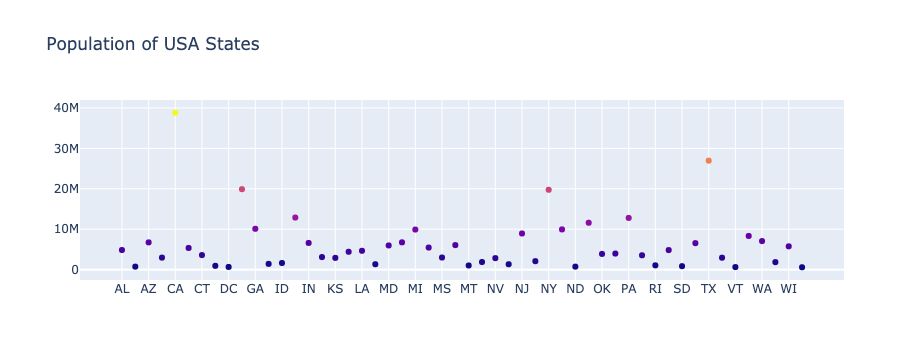

In [133]:
data = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_usa_states.csv')
fig = go.Figure(data=go.Scatter(x=data['Postal'],
                                y=data['Population'],
                                mode='markers',
                                marker_color=data['Population'],
                                text=data['State']))
fig.update_layout(title='Population of USA States')
fig.show()

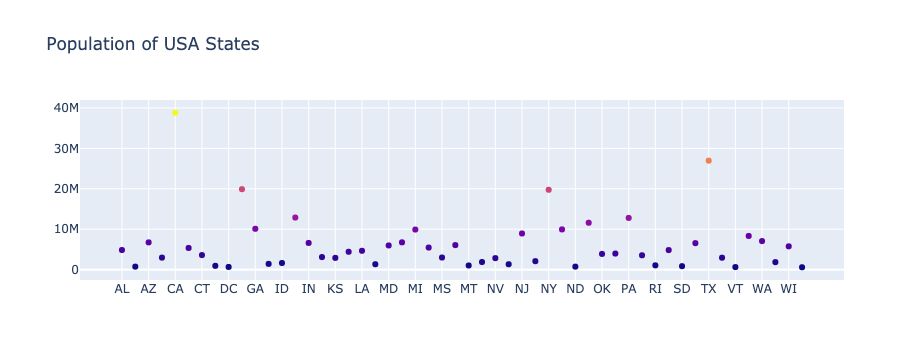

In [133]:
data = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_usa_states.csv')
fig = go.Figure(data=go.Scatter(x=data['Postal'],
                                y=data['Population'],
                                mode='markers',
                                marker_color=data['Population'],
                                text=data['State']))
fig.update_layout(title='Population of USA States')
fig.show()

### 색상 차원(Color Dimension)

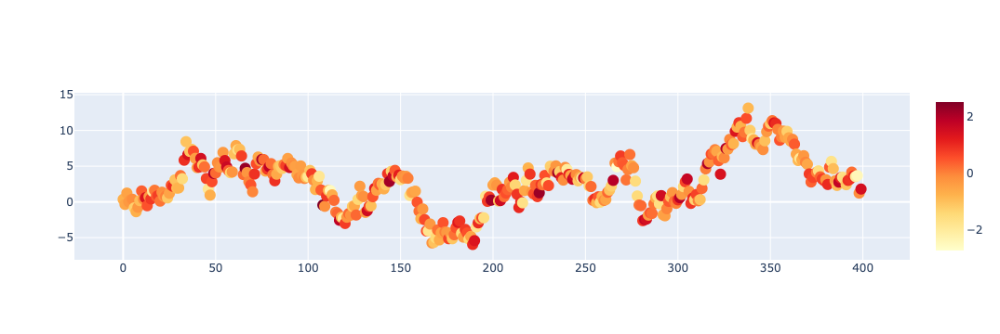

In [134]:
fig = go.Figure(data=go.Scatter(
    y=np.random.randn(400).cumsum(), mode='markers', marker=dict(size=12, 
                                                                color=np.random.randn(400),
                                                                colorscale='YlOrRd',
                                                                showscale=True)))
fig.show()

### 템플릿(Templates)

In [135]:
pio.templates


Templates configuration
-----------------------
    Default template: 'plotly'
    Available templates:
        ['ggplot2', 'seaborn', 'simple_white', 'plotly',
         'plotly_white', 'plotly_dark', 'presentation', 'xgridoff',
         'ygridoff', 'gridon', 'none']

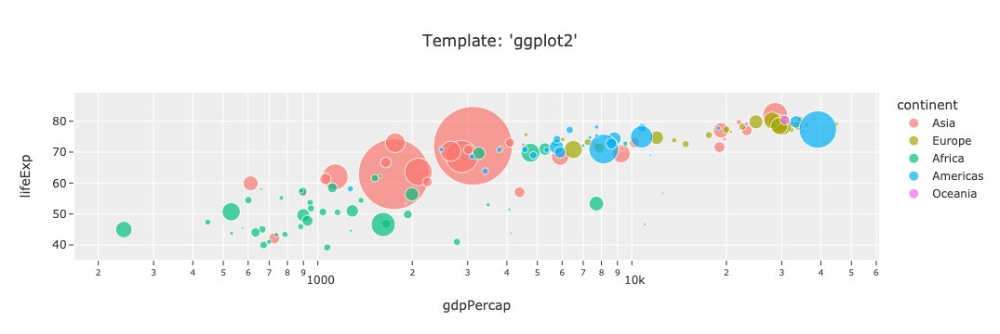

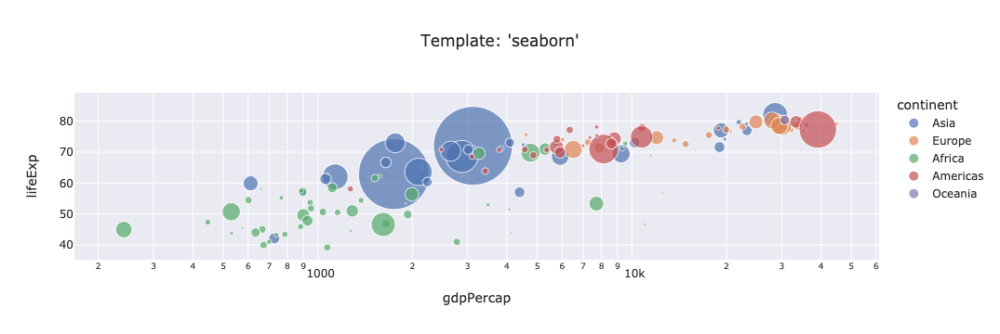

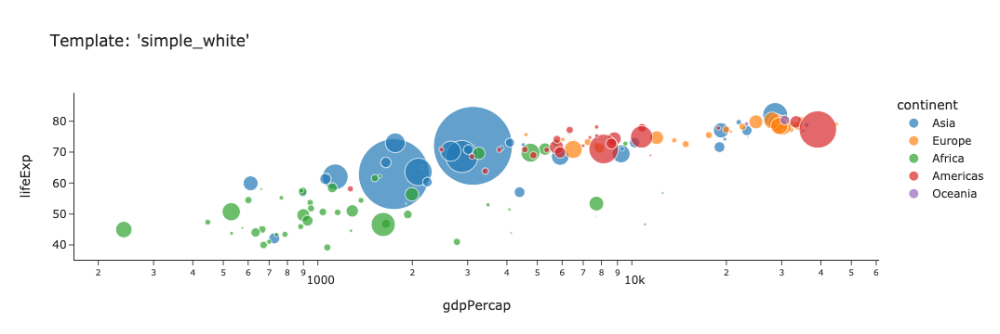

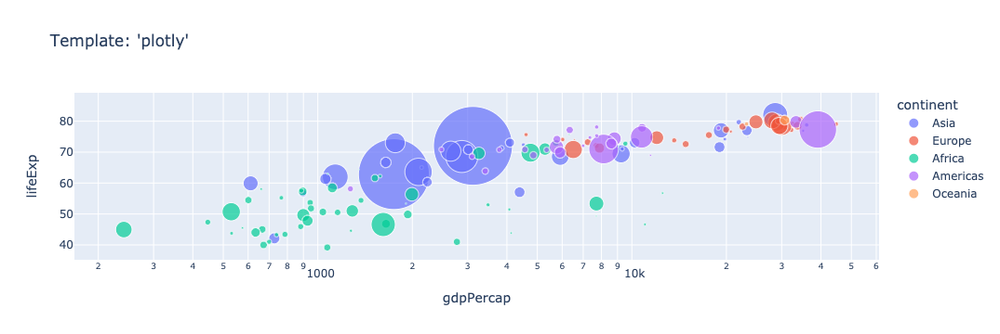

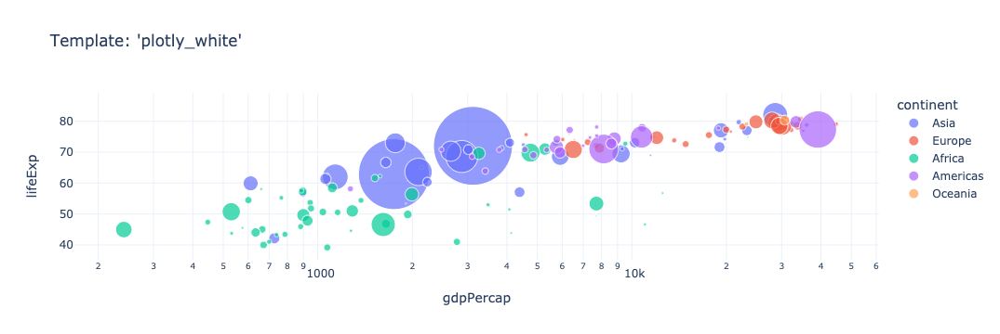

...

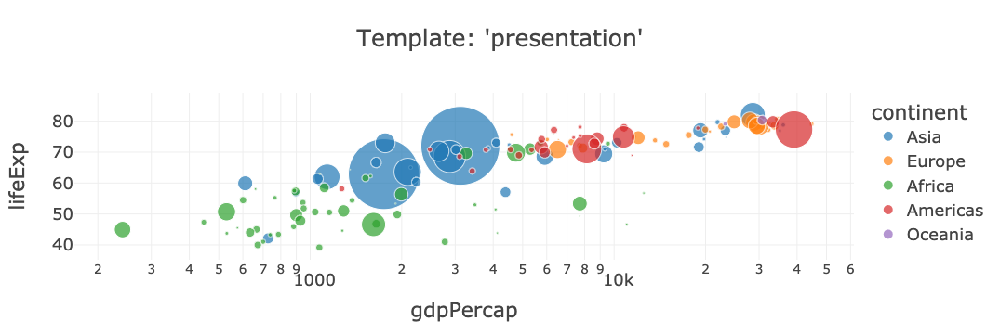

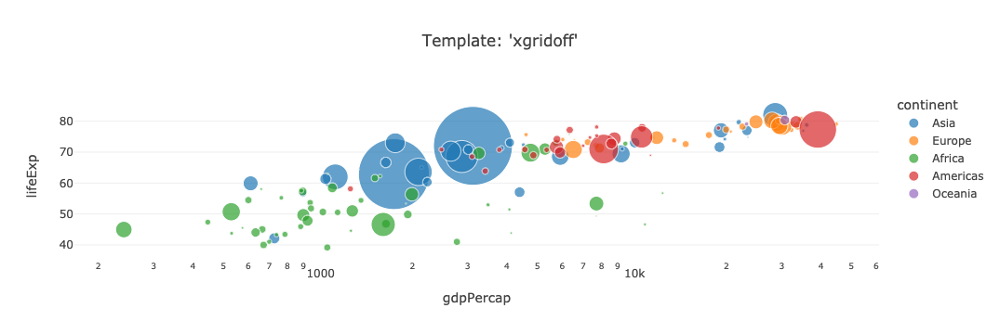

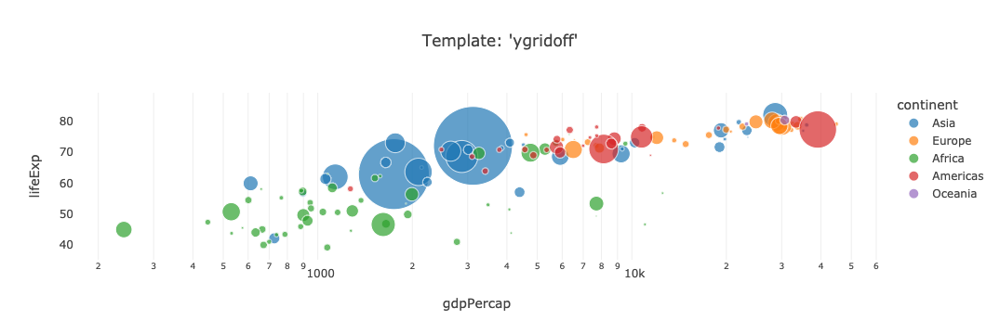

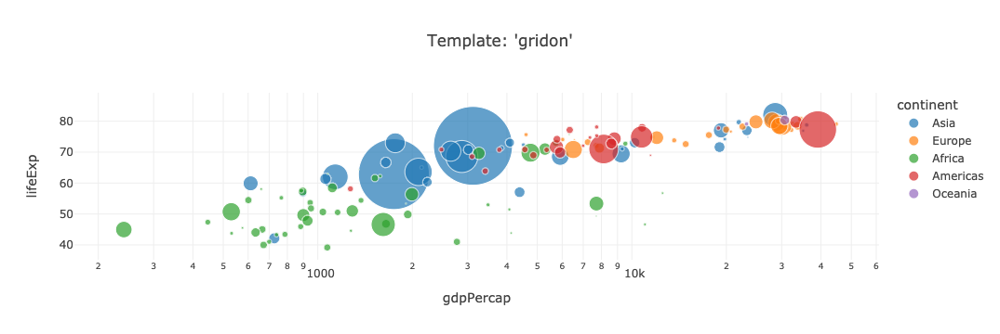

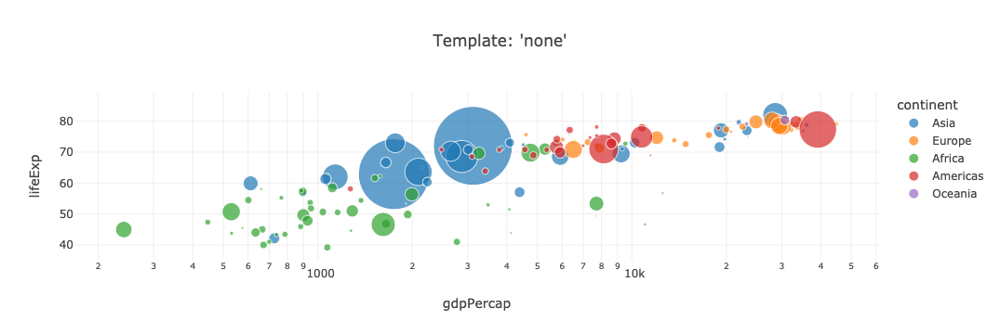

In [136]:
gapminder_2002= gapminder.query("year==2002")
for template in ['ggplot2', 'seaborn', 'simple_white', 'plotly',
         'plotly_white', 'plotly_dark', 'presentation', 'xgridoff',
         'ygridoff', 'gridon', 'none']:
    fig = px.scatter(gapminder_2002, x='gdpPercap', y='lifeExp', color='continent',
                     size='pop', log_x=True, size_max=60,
                     template=template, title="Template: '%s'" % template)
    fig.show()
    

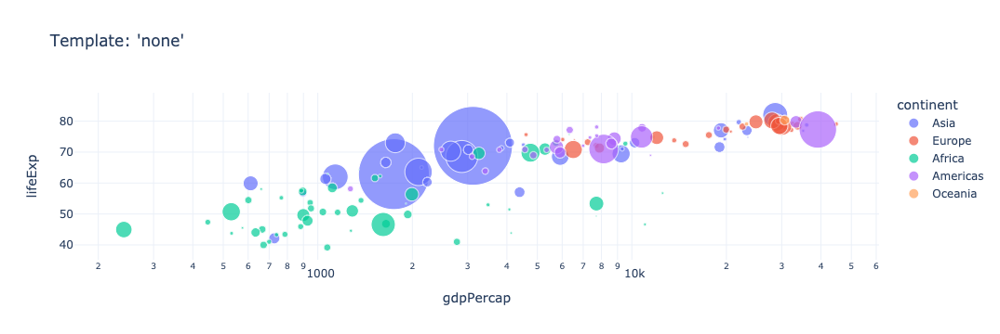

In [137]:
# template 사용 고정 none이 plotly white로 지정됨
pio.templates.default = "plotly_white"

fig = px.scatter(gapminder_2002, x='gdpPercap', y='lifeExp', color='continent',
                     size='pop', log_x=True, size_max=60,
                      title="Template: '%s'" % template)
fig.show()

### 구성(Configuration)

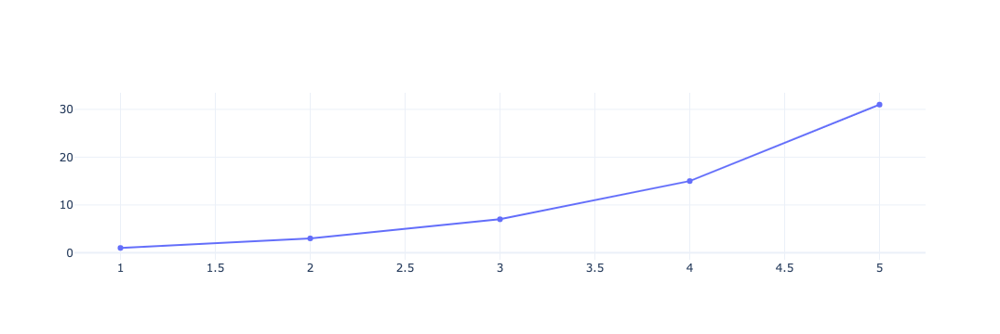

In [138]:
fig = go.Figure()
config = dict({'scrollZoom':True})
fig.add_trace(go.Scatter(x = [1, 2, 3, 4, 5],
                         y= [1, 3, 7, 15, 31]))
fig.show(config=config)

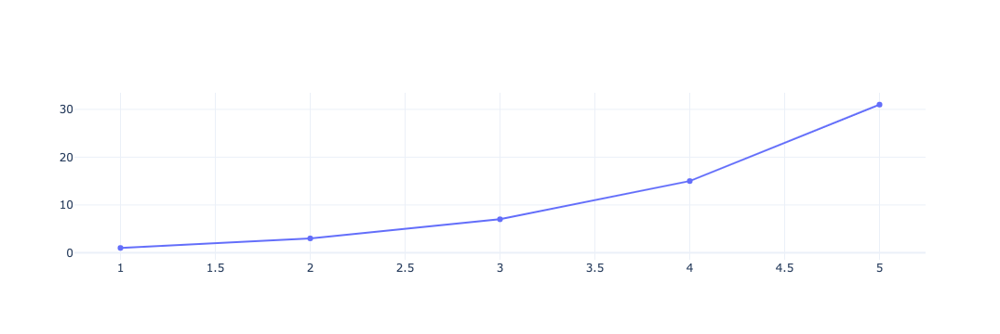

In [139]:
fig = go.Figure()
config = dict({'displayModeBar':True})
fig.add_trace(go.Scatter(x = [1, 2, 3, 4, 5],
                         y= [1, 3, 7, 15, 31]))
fig.show(config=config)

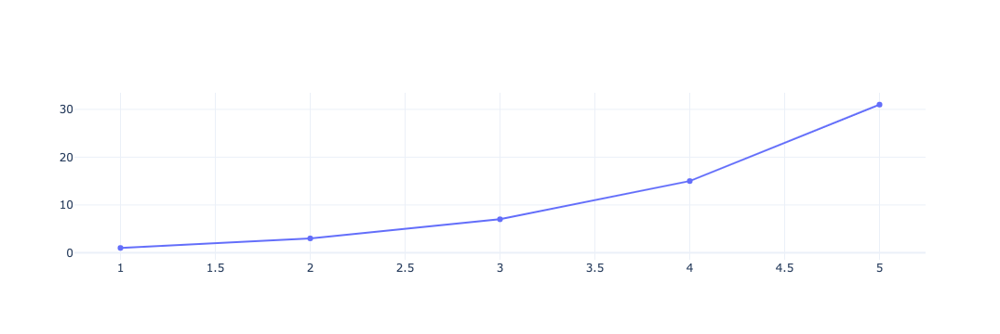

In [140]:
fig = go.Figure()
config = dict({'displaylogo':False})
fig.add_trace(go.Scatter(x = [1, 2, 3, 4, 5],
                         y= [1, 3, 7, 15, 31]))
fig.show(config=config)

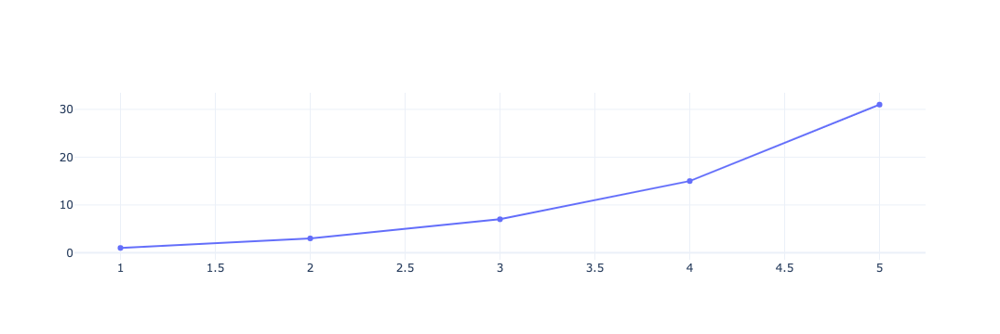

In [141]:
fig = go.Figure()
config = dict({'responsive':False})
fig.add_trace(go.Scatter(x = [1, 2, 3, 4, 5],
                         y= [1, 3, 7, 15, 31]))
fig.show(config=config)

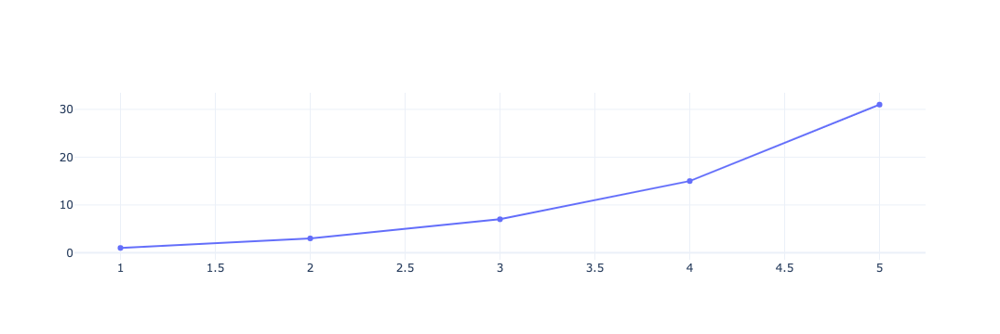

In [142]:
fig = go.Figure()
config = dict({'staticPlot':True})# 반응 고정
fig.add_trace(go.Scatter(x = [1, 2, 3, 4, 5],
                         y= [1, 3, 7, 15, 31]))
fig.show(config=config)

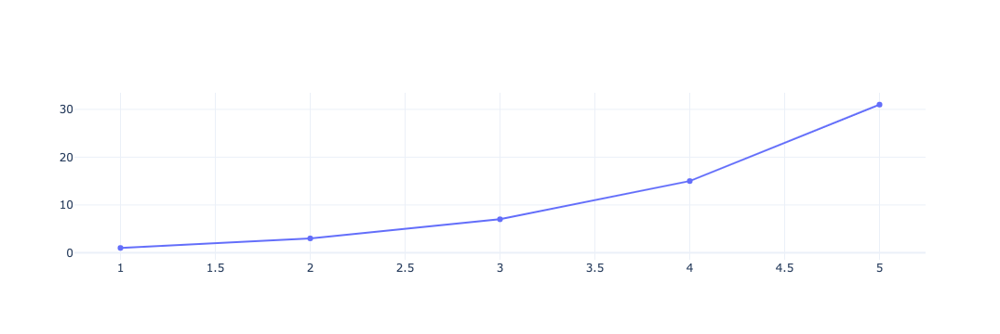

In [143]:
fig = go.Figure()
config = dict({'scrollZoom':True,
              'displayModeBar':True,
              'editable':True})
fig.add_trace(go.Scatter(x = [1, 2, 3, 4, 5],
                         y= [1, 3, 7, 15, 31]))
fig.show(config=config)

### 높이, 너비 및 여백 조정

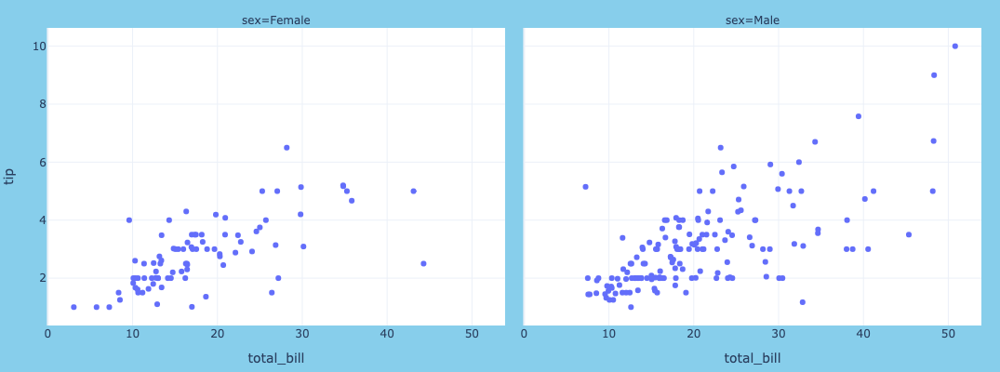

In [144]:
fig = px.scatter(tips, x='total_bill', y='tip', facet_col='sex',
                 width=800, height=400)

fig.update_layout(margin=dict(l=10, r=20, t=30, b=40),
                  paper_bgcolor='skyblue')
fig.show()

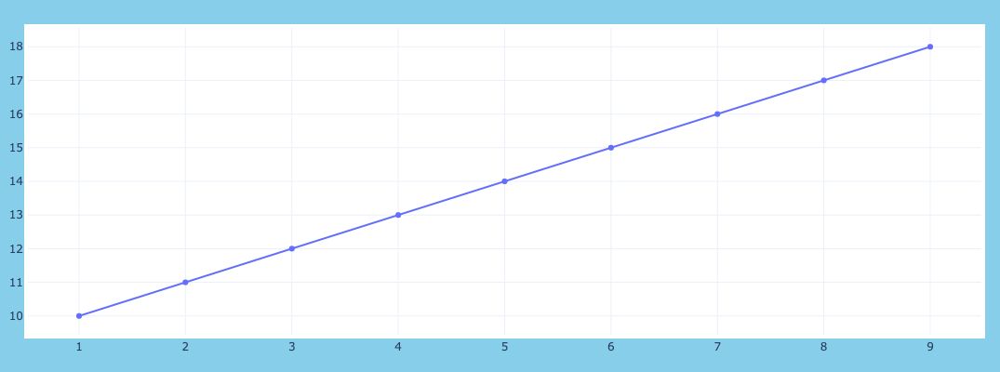

In [145]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=np.arange(1, 10),
                         y=np.arange(10,20)))
fig.update_layout(autosize=False, width=400, height=400,
                  margin=dict(l=10, r=20, t=30, b=40, pad=4),
                  paper_bgcolor='skyblue')
fig.show()

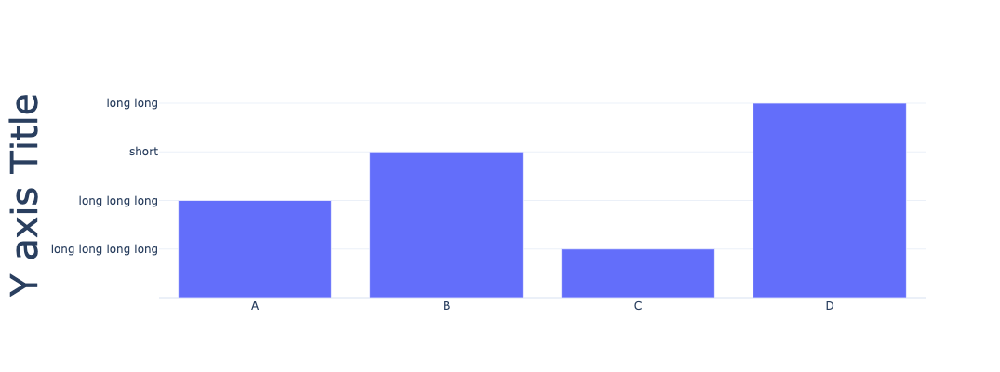

In [146]:
fig = go.Figure()
fig.add_trace(go.Bar(x=['A', 'B', 'C', 'D'], y=[2, 3, 1, 4]))
fig.update_layout(autosize=False, width=400, height=400,
                  yaxis=dict(
                      title_text='Y axis Title',
                      ticktext=['long long long long','long long long', 'short', 'long long'],
                      tickvals=[1, 2, 3, 4],
                      tickmode='array',
                      titlefont=dict(size=40)
                  ))
fig.update_yaxes(automargin=True)
fig.show()

### 눈금(Tick) 형식 지정

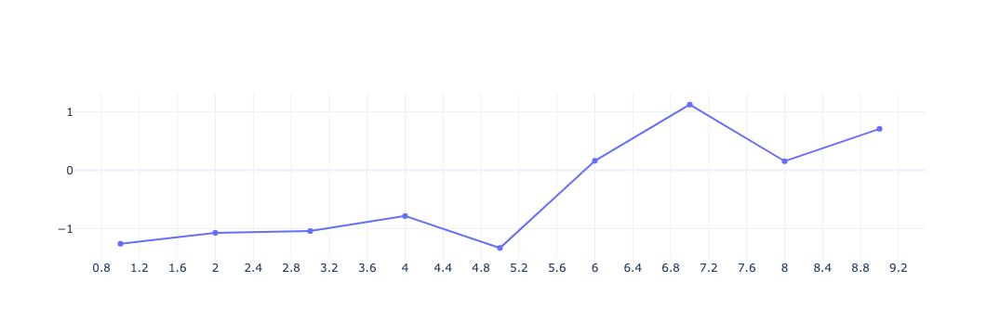

In [147]:
fig = go.Figure(go.Scatter(x = np.arange(1, 10),
                           y = np.random.randn(10).cumsum()))
fig.update_layout(xaxis = dict(tickmode ='linear',
                               tick0= 0.8, dtick=0.4))
fig.show()

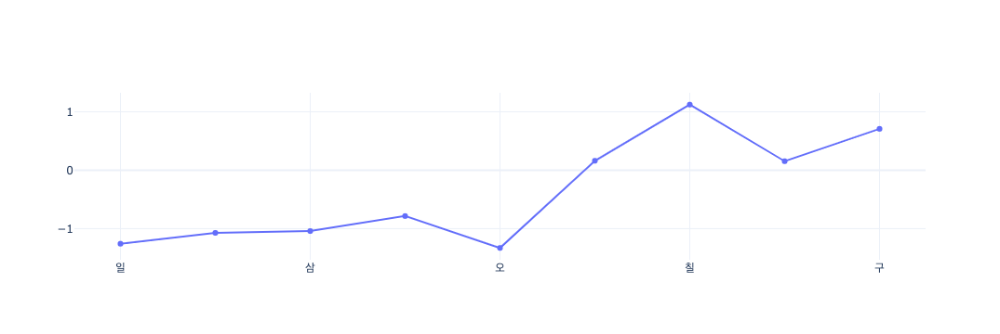

In [148]:
fig.update_layout(xaxis = dict(
    tickmode ='array',
    tickvals = [1, 3, 5, 7, 9],
    ticktext = ['일', '삼', '오', '칠', '구']
))
                               
fig.show()

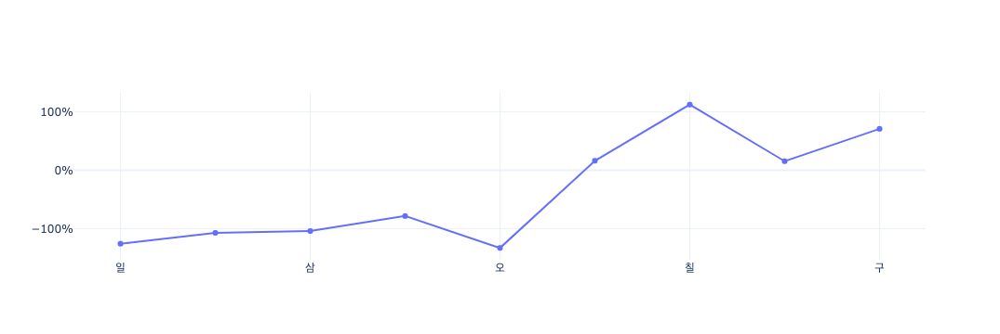

In [149]:
fig.update_layout(yaxis_tickformat = '%')
fig.show()

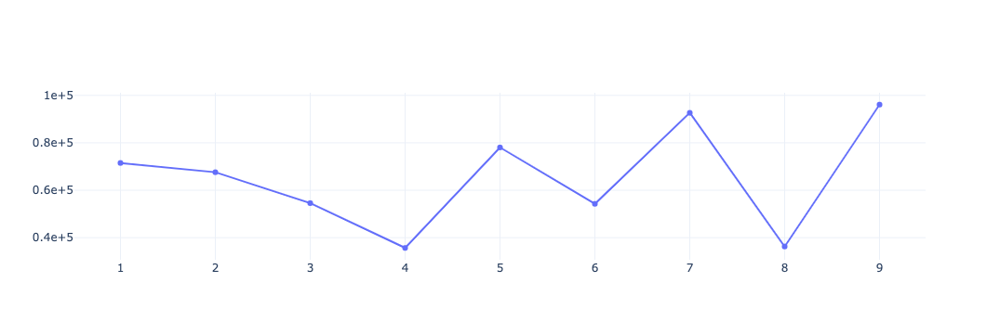

In [150]:
fig = go.Figure(go.Scatter(x= np.arange(1,10),
                           y= np.random.randint(10000, 100000, size=10)))
fig.update_layout(yaxis=dict(showexponent='all', exponentformat='e'))
fig.show()

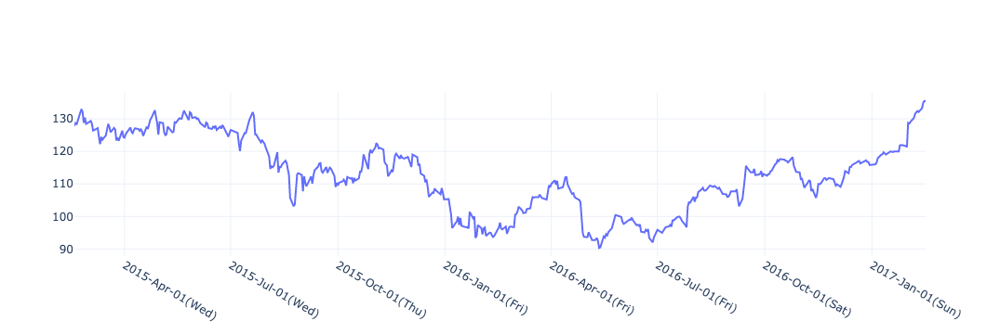

In [151]:
fig = go.Figure(go.Scatter(x=aapl['Date'], y=aapl['AAPL.Close']))
fig.update_layout(xaxis_tickformat='%Y-%b-%d(%a)')
fig.show()

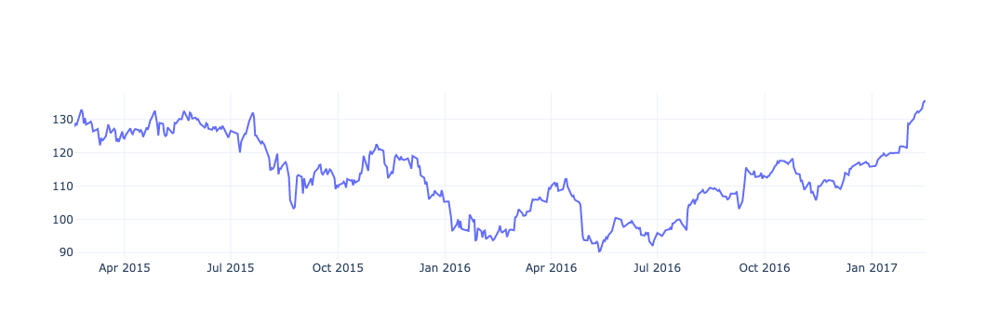

In [152]:
fig = go.Figure(go.Scatter(x=aapl['Date'], y=aapl['AAPL.Close']))
fig.update_layout(xaxis_tickformatstops=[
    dict(dtickrange=[None, 1000],value='%H:%M:%S.%L'),
    dict(dtickrange=[1000, 60000],value='%H:%M:%S'),
    dict(dtickrange=[60000, 3600000],value='%H:%M'),
    dict(dtickrange=[3600000, 86400000],value='%H:%M'),
    dict(dtickrange=[86400000, 604800000],value='%b-%e'),
    dict(dtickrange=[604800000, 'M1'],value='%Y-%b'),
    dict(dtickrange=['M12', None],value='%Y')])
fig.show()

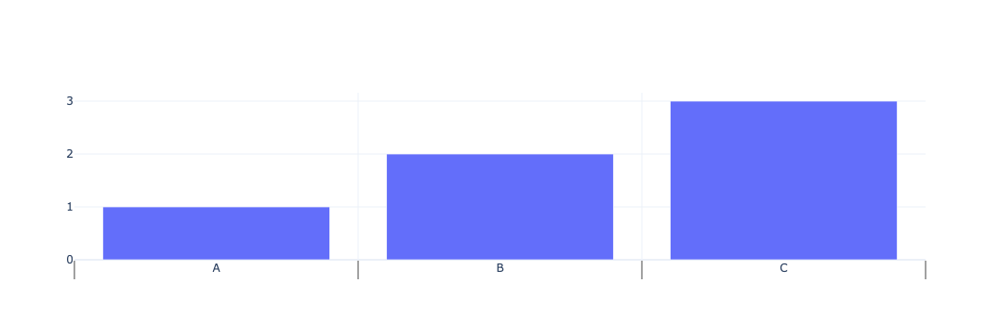

In [153]:
fig = go.Figure(go.Bar(x=['A','B','C'],
                       y=[1, 2, 3]))
fig.update_xaxes(showgrid=True,
                 ticks='outside',
                 tickson='boundaries',
                 ticklen=20)
fig.show()

### 글꼴, 제목, 범례 항목 및 축 제목 설정

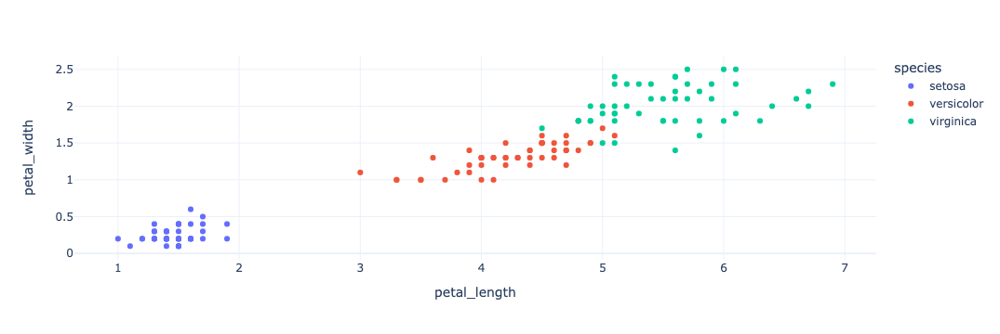

In [154]:
fig = px.scatter(iris, x='petal_length', y='petal_width', color='species')
fig.show() #자동 범례붙음

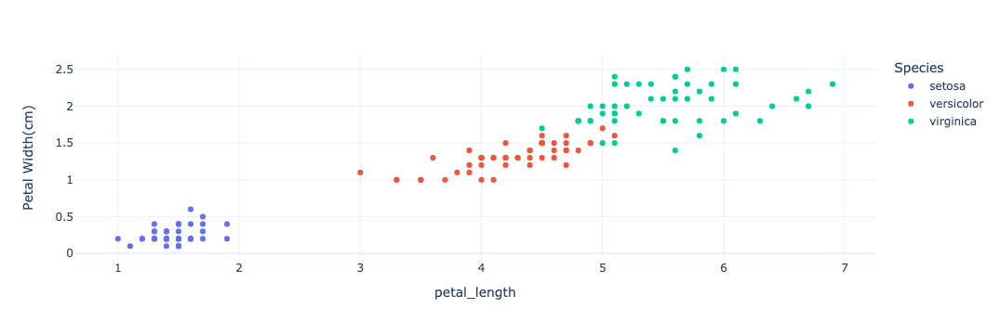

In [155]:
fig = px.scatter(iris, x='petal_length', y='petal_width', color='species',
                labels={'petal_lengh':'Petal Length(cm)',
                        'petal_width':'Petal Width(cm)',
                        'species':'Species'})

fig.show()

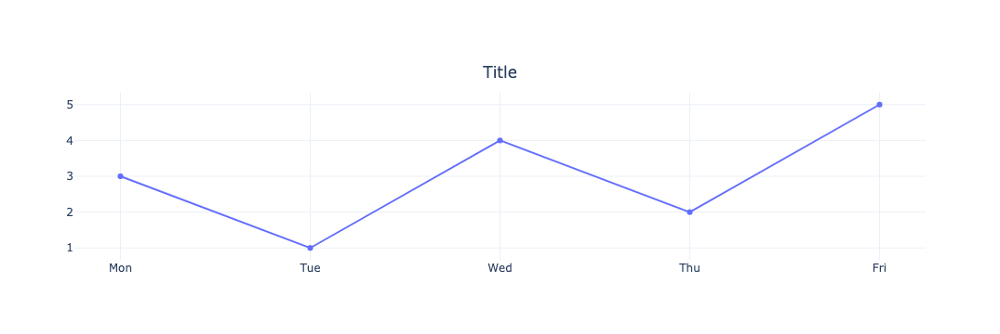

In [156]:
fig = go.Figure(go.Scatter(y=[3, 1, 4, 2, 5],
                           x=['Mon', 'Tue', 'Wed', 'Thu', 'Fri']))
fig.update_layout(title={'text':'Title',
                         'y':0.8, 'x':0.5,
                         'xanchor':'center', 'yanchor':'top'})
fig.show()

### 축(Axes)

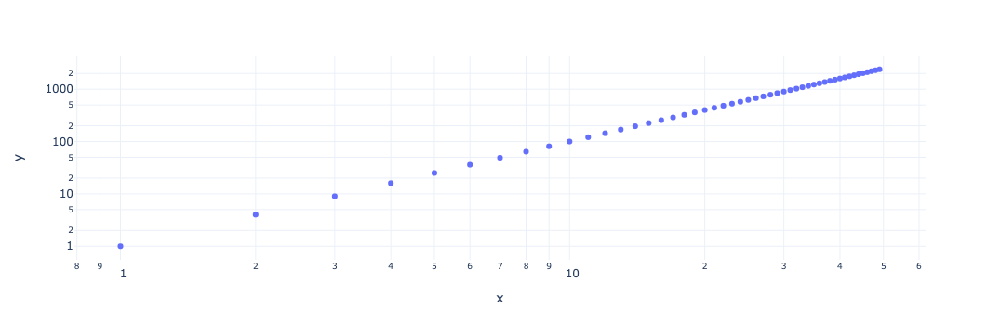

In [157]:
x = np.arange(50)
fig = px.scatter(x=x, y=x**2, log_x=True, log_y=True)
fig.show()

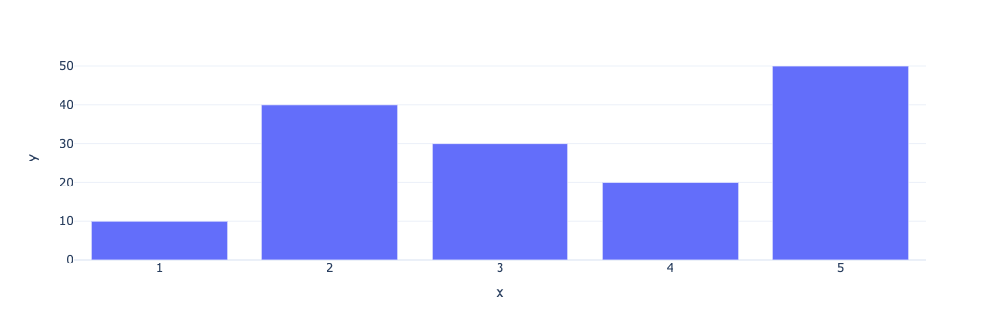

In [158]:
fig = px.bar(x=[1,2,3,4,5],y=[10, 40, 30, 20, 50])
fig.update_layout(xaxis_type='category')
fig.show()

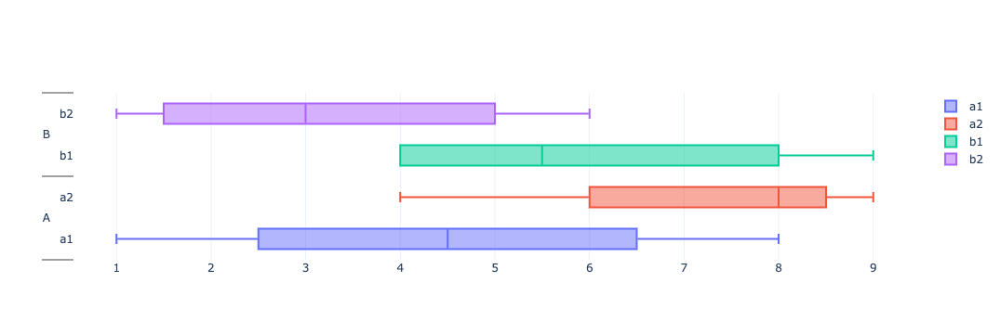

In [159]:
fig = go.Figure()
fig.add_trace(go.Box(x=np.random.randint(1, 10, 4),
                     y=[['A', 'A', 'A', 'A'],
                        ['a1', 'a1', 'a1', 'a1']],
                     name='a1',
                     orientation='h'))
fig.add_trace(go.Box(x=np.random.randint(1, 10, 4),
                     y=[['A', 'A', 'A', 'A'],
                        ['a2', 'a2', 'a2', 'a2']],
                     name='a2',
                     orientation='h'))
fig.add_trace(go.Box(x=np.random.randint(1, 10, 4),
                     y=[['B', 'B', 'B', 'B'],
                        ['b1', 'b1', 'b1', 'b1']],
                     name='b1',
                     orientation='h'))
fig.add_trace(go.Box(x=np.random.randint(1, 10, 4),
                     y=[['B', 'B', 'B', 'B'],
                        ['b2', 'b2', 'b2', 'b2']],
                     name='b2',
                     orientation='h'))
fig.update_layout()
fig.show()

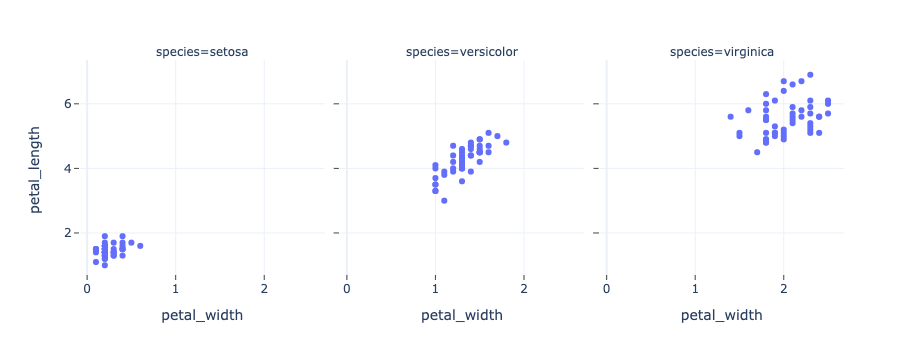

In [160]:
fig = px.scatter(iris, x='petal_width', y='petal_length', facet_col='species')
fig.update_xaxes(ticks='inside')
fig.update_yaxes(ticks='outside')
fig.show()

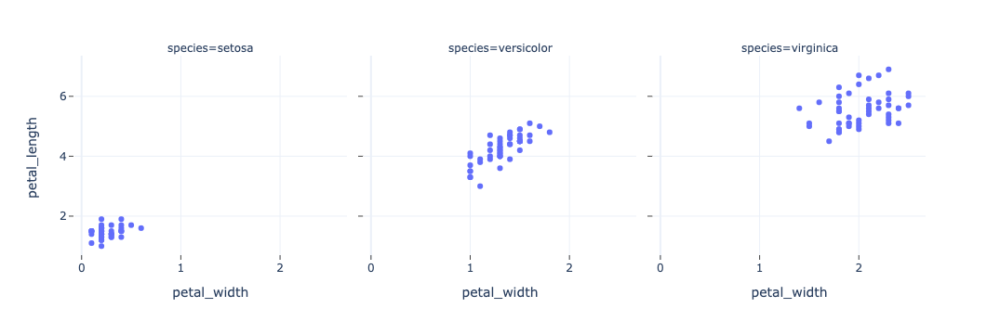

In [161]:
fig.update_yaxes(nticks=4)
fig.show()

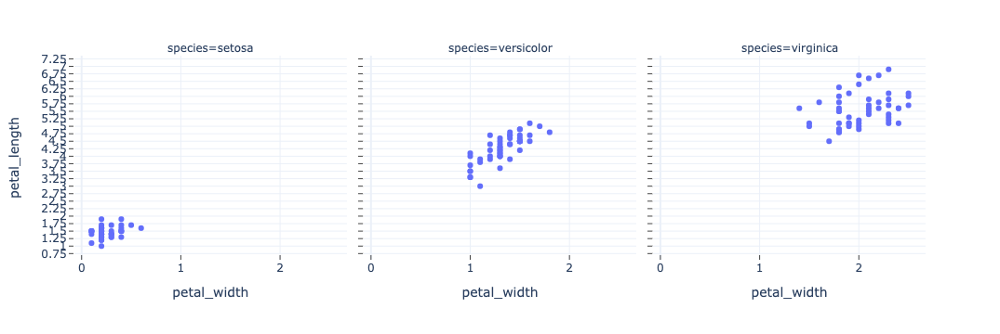

In [162]:
fig.update_yaxes(tick0=0.5, dtick=0.25)
fig.show()

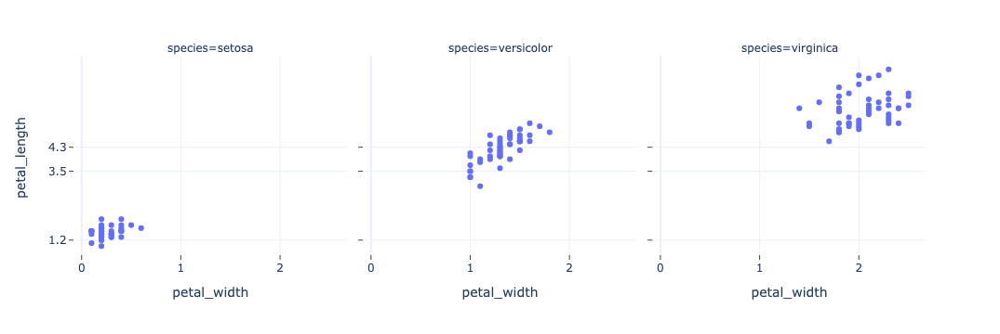

In [163]:
fig.update_yaxes(tickvals=[1.2, 3.5, 4.3, 7.5])
fig.show()

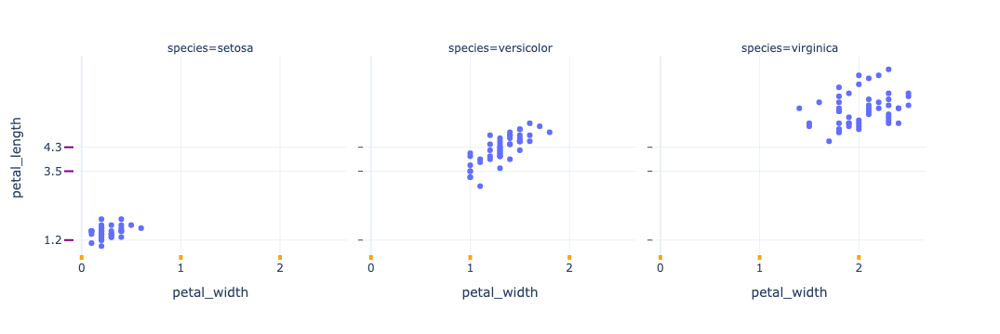

In [164]:
fig.update_xaxes(ticks='inside', tickwidth=4, tickcolor='orange', ticklen=5)
fig.update_yaxes(ticks='outside', tickwidth=2, tickcolor='purple', ticklen=10, col=1)
fig.show()
#눈금 스타일 지정하는것 

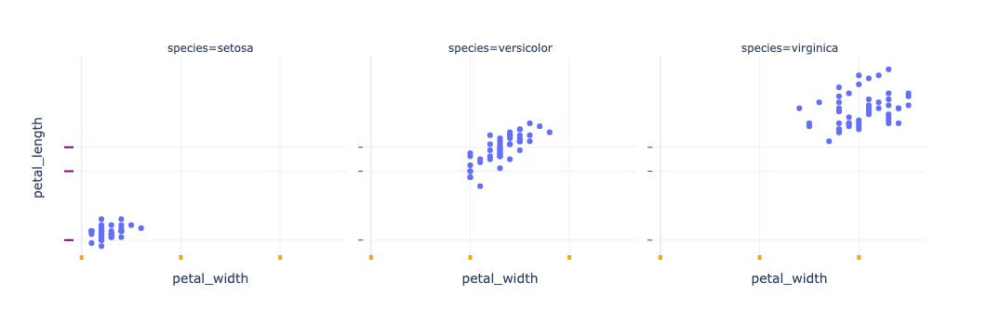

In [165]:
fig.update_xaxes(showticklabels=False)
fig.update_yaxes(showticklabels=False)
fig.show()

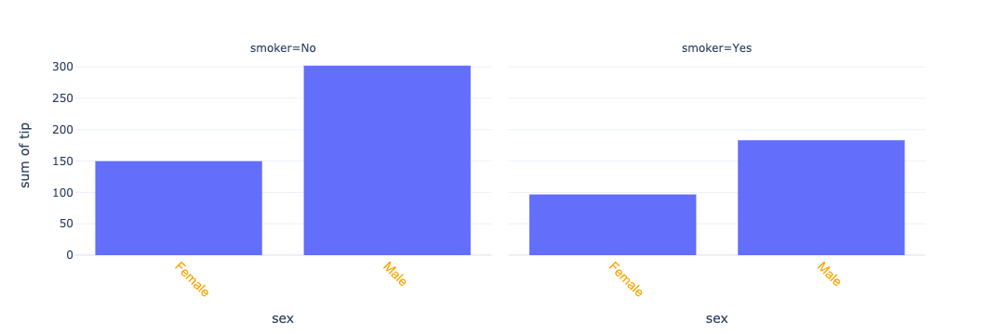

In [166]:
fig = px.histogram(tips, x='sex', y='tip', histfunc='sum', facet_col='smoker')
fig.update_xaxes(tickangle=45, tickfont=dict(family='Arial', color='orange', size=14))
fig.show()
                   

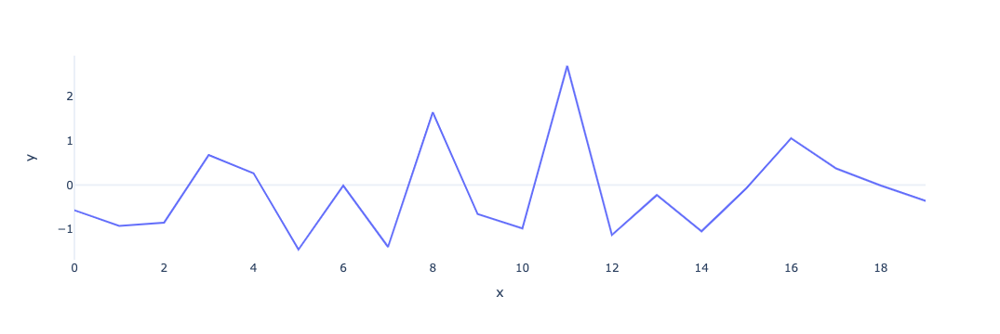

In [167]:
fig = px.line(y=np.random.randn(20))
fig.update_layout(xaxis_showgrid=False, yaxis_showgrid=False)
fig.show()
# grid 격자무늬 삭제 0에만 줄그어져있음 

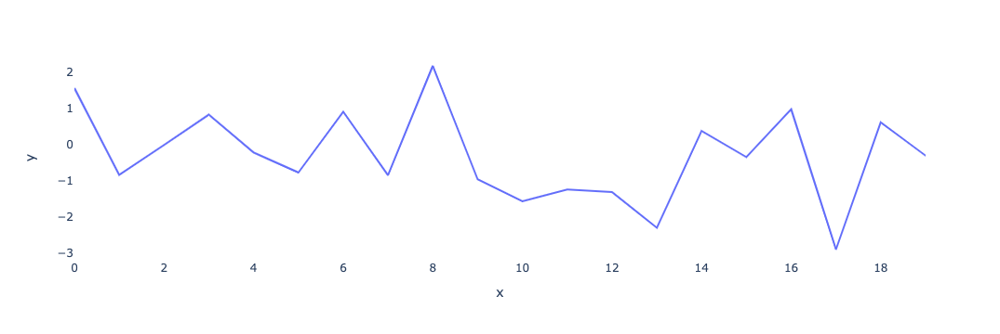

In [168]:
fig = px.line(y=np.random.randn(20))
fig.update_layout(
    xaxis=dict(showgrid=False,zeroline=False),
    yaxis=dict(showgrid=False,zeroline=False))
               
fig.show()

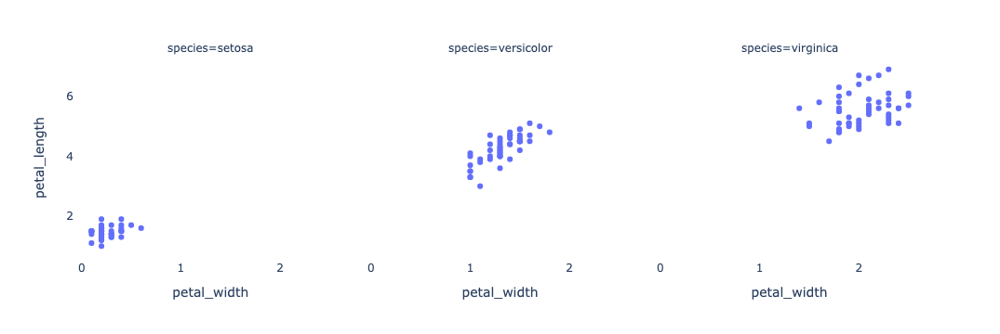

In [169]:
fig = px.scatter(iris, x='petal_width', y='petal_length', facet_col='species')
fig.update_xaxes(showgrid=False, zeroline=False)
fig.update_yaxes(showgrid=False, zeroline=False)
# layout 말고 update 에서도 그리드삭제가능               
fig.show()

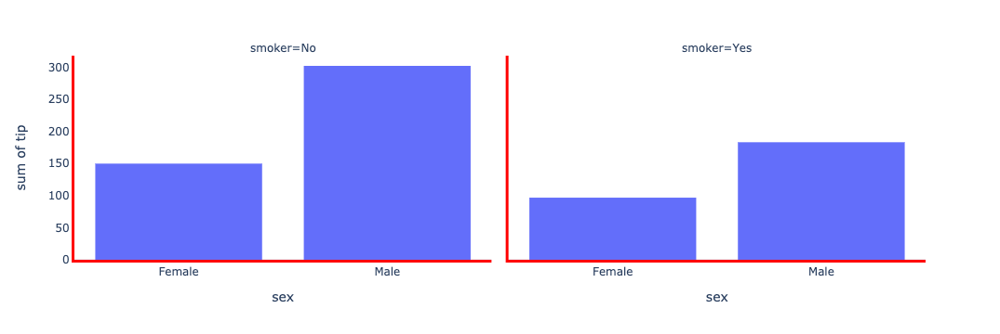

In [170]:
fig = px.histogram(tips, x='sex', y='tip', histfunc='sum', facet_col='smoker')
fig.update_xaxes(showgrid=False, linewidth=3, linecolor='red')
fig.update_yaxes(showgrid=False, linewidth=3, linecolor='red')
fig.show()

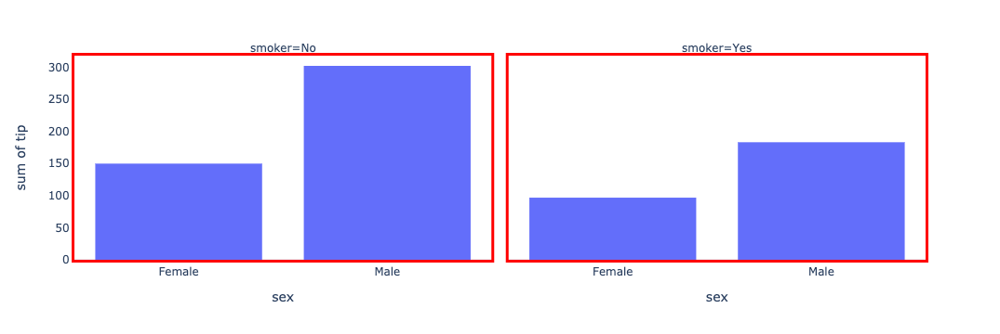

In [171]:
fig.update_xaxes(showgrid=False, linewidth=3, linecolor='red', mirror=True)
fig.update_yaxes(showgrid=False, linewidth=3, linecolor='red', mirror=True)
fig.show()

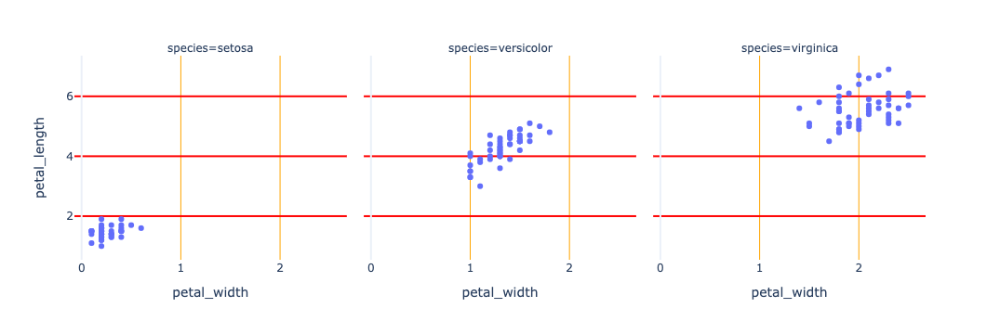

In [172]:
fig = px.scatter(iris, x='petal_width', y='petal_length', facet_col='species')
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='orange')
fig.update_yaxes(showgrid=True, gridwidth=2, gridcolor='red')

fig.show()

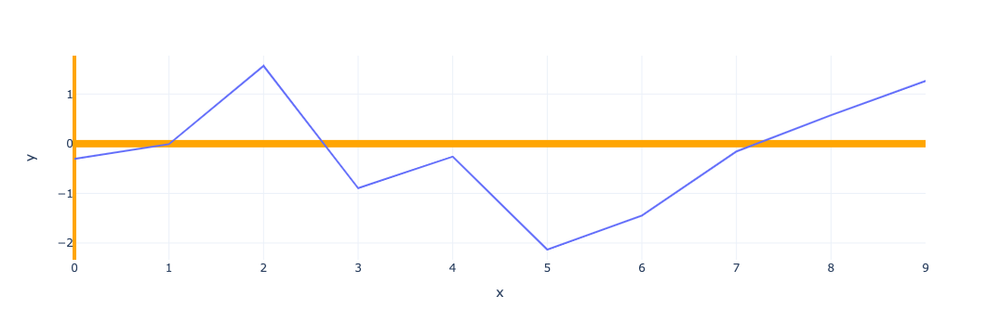

In [173]:
fig = px.line(y=np.random.randn(10))
fig.update_xaxes(zeroline=True, zerolinewidth=4, zerolinecolor='orange')
fig.update_yaxes(zeroline=True, zerolinewidth=8, zerolinecolor='orange')
fig.show()

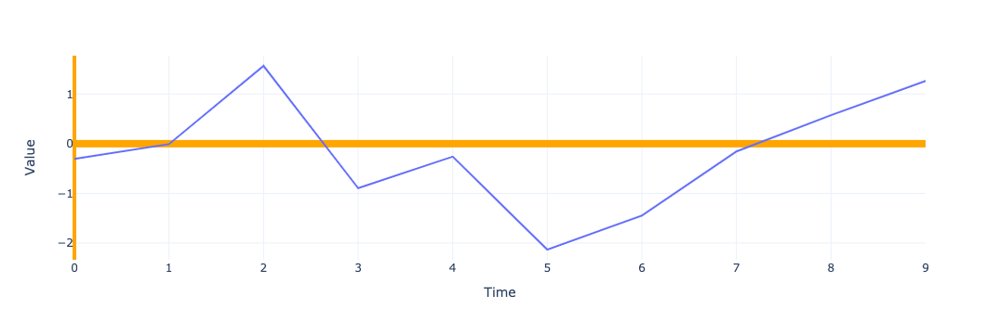

In [174]:
fig.update_xaxes(title_text='Time')
fig.update_yaxes(title_text='Value')
fig.show()
#label 지정

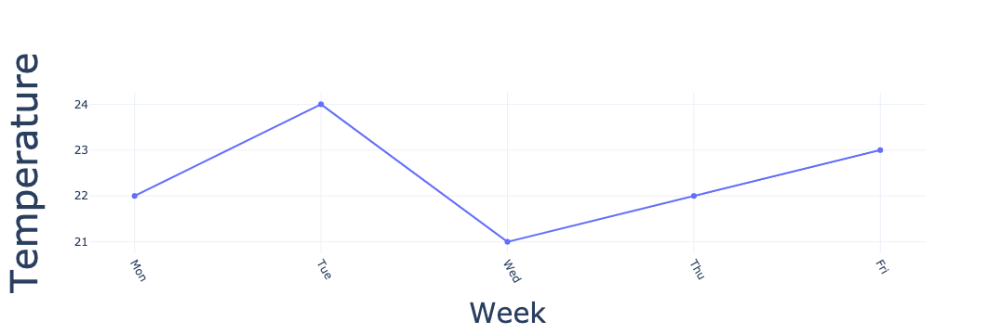

In [175]:
fig = go.Figure(go.Scatter(
    mode='lines+markers',
    y=[22, 24, 21, 22, 23],
    x=['Mon', 'Tue', 'Wed', 'Thu', 'Fri']
))
fig.update_layout(
    xaxis=dict(
        tickangle=60,
        title_text='Week',
        title_font={'size':30},
        title_standoff=20),
    yaxis=dict(
        title_text='Temperature',
        title_font={'size':40},
        title_standoff=40)
)
fig.show()

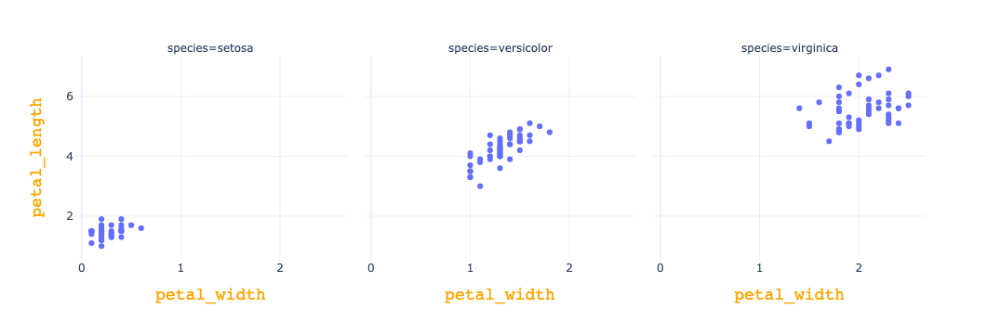

In [176]:
fig = px.scatter(iris, x='petal_width', y='petal_length', facet_col='species')
fig.update_xaxes(title_font=dict(size=18, family='Courier', color='orange'))
fig.update_yaxes(title_font=dict(size=18, family='Courier', color='orange'))
fig.show()

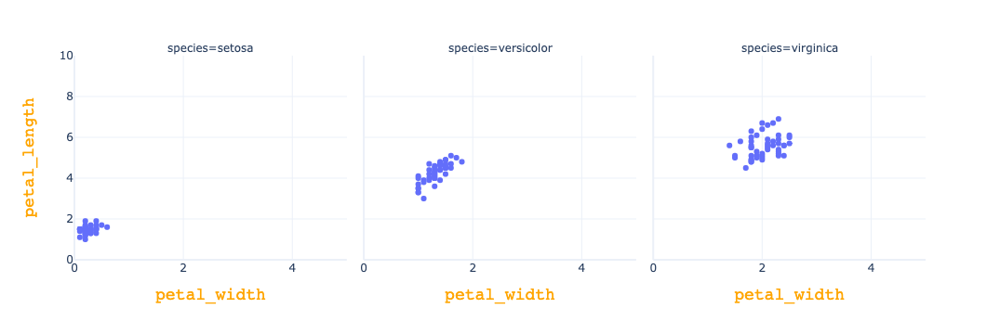

In [177]:
fig.update_xaxes(range=[0,5])
fig.update_yaxes(range=[0,10])
fig.show()

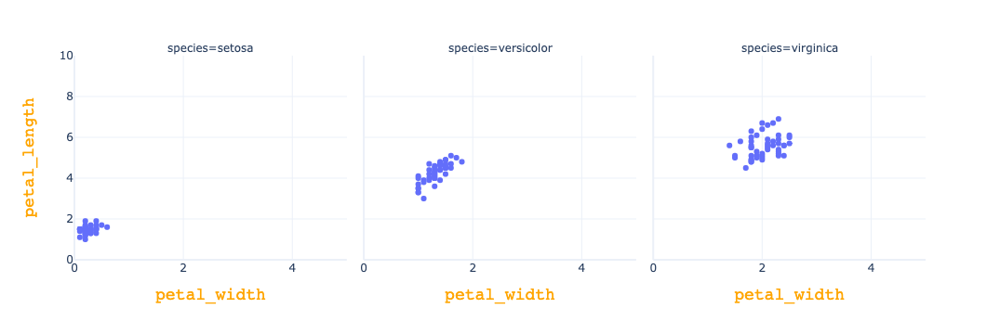

In [178]:
fig.update_xaxes(fixedrange=True)
fig.show()
#확대할때 고정시키는것 

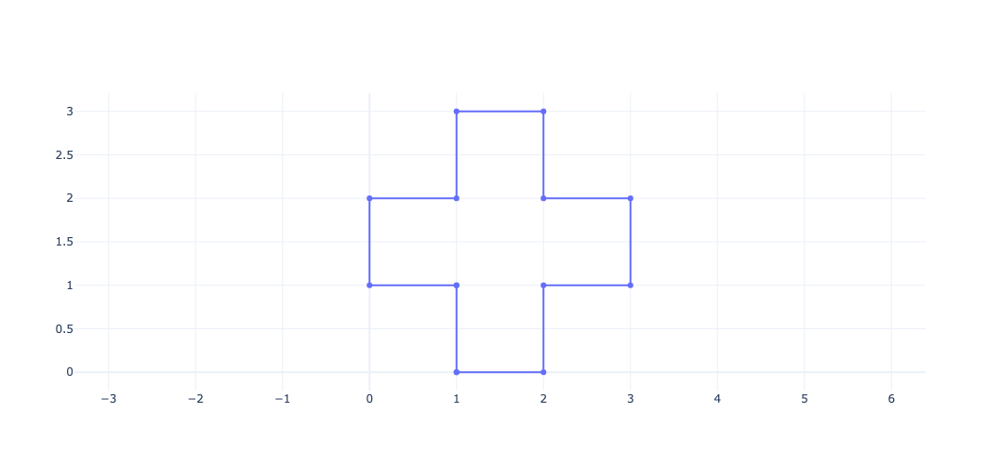

In [179]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=[1, 1, 1, 0, 0, 1, 1, 2, 2, 3, 3, 2, 2, 1],
                        y=[0, 1, 1, 1, 2, 2, 3, 3, 2, 2, 1, 1, 0, 0]))
fig.update_layout(width=600, height=500, yaxis=dict(scaleanchor='x', scaleratio=1))
fig.show()


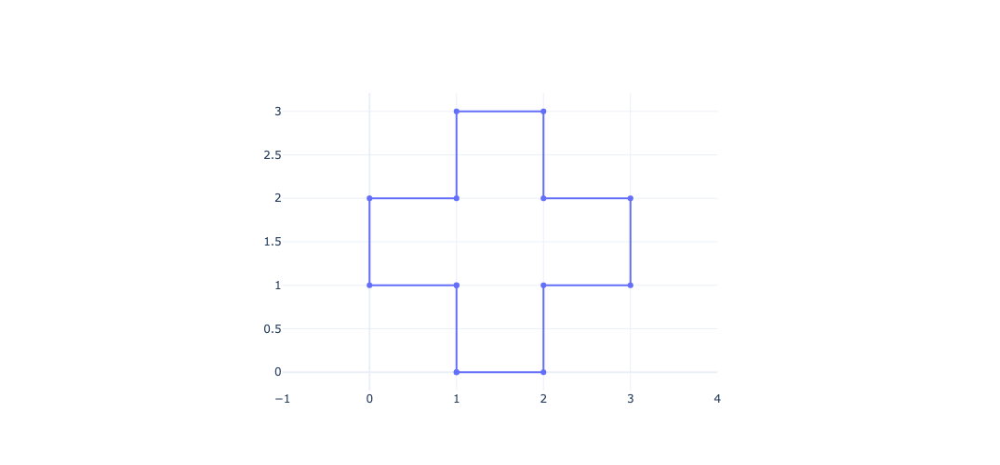

In [180]:
fig.update_layout(width=600, height=500, xaxis=dict(range=[-1,4],
                                                    constrain='domain'),
                  yaxis=dict(scaleanchor='x', scaleratio=1))
fig.show()
#축고정

                  

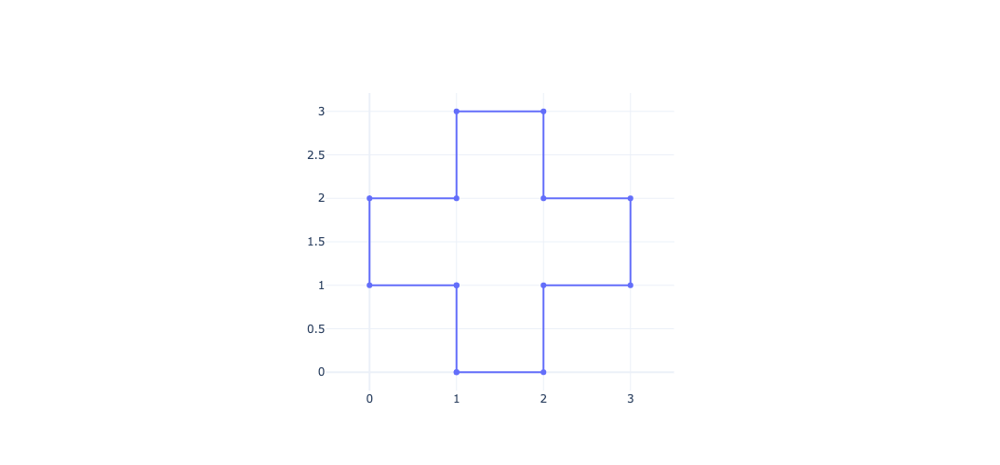

In [181]:
fig.update_layout(width=600, height=500, xaxis=dict(range=[-0.5, 3.5],
                                                    constrain='domain'),
                  yaxis=dict(scaleanchor='x', scaleratio=1))
fig.show()

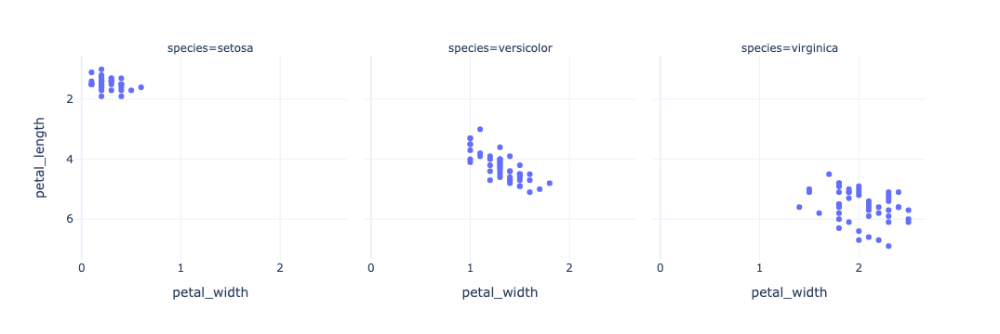

In [182]:
fig = px.scatter(iris, x='petal_width', y='petal_length', facet_col='species')
fig.update_yaxes(autorange='reversed')
fig.show()
#y축반전

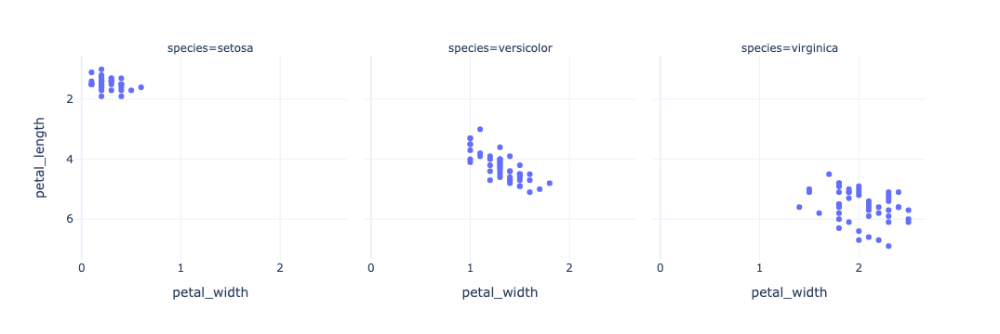

In [183]:
fig.update_yaxes(range=[9,3])
fig.show()
#축반전 다른방법

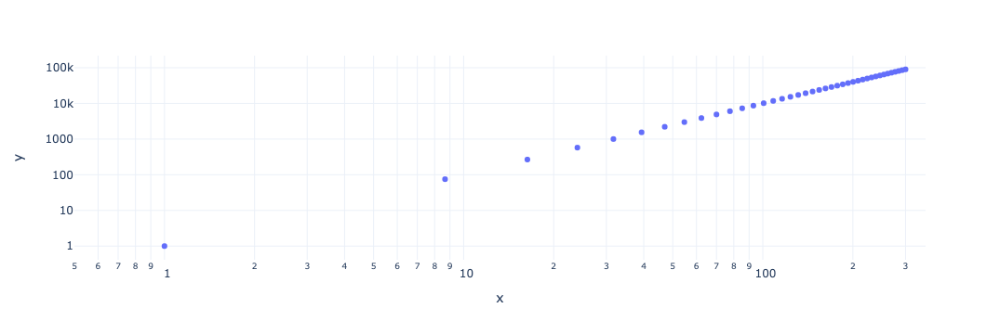

In [184]:
x = np.linspace(1, 300, 40)
fig= px.scatter(x=x, y=x**2, log_x=True, log_y=True, range_x=[0.5, 350])
fig.show()
#log range를 걸거나


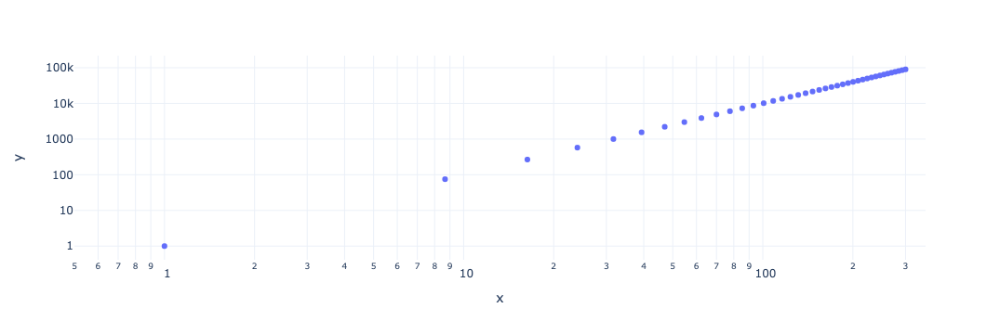

In [185]:
fig.update_xaxes(type="log", range=[np.log10(0.5), np.log10(350)])
fig.update_yaxes(type="log")
fig.show()
#축에다가 직접지정가능
                 

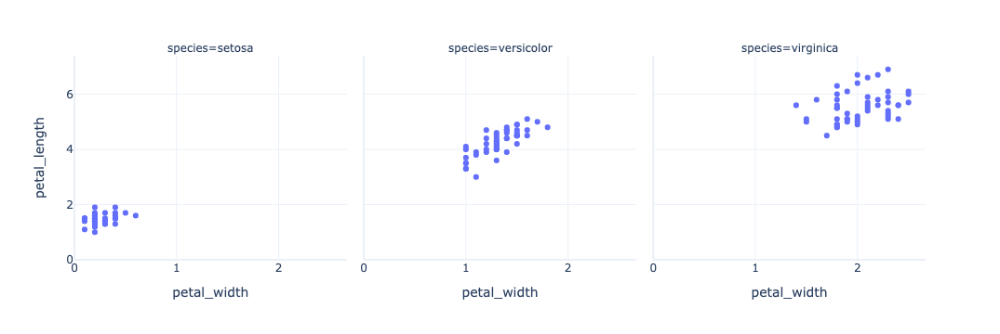

In [186]:
fig = px.scatter(iris, x='petal_width', y='petal_length', facet_col='species')
fig.update_xaxes(rangemode='nonnegative')
fig.update_yaxes(rangemode='tozero') # y축 0표시
fig.show()

### 범례(Legends)

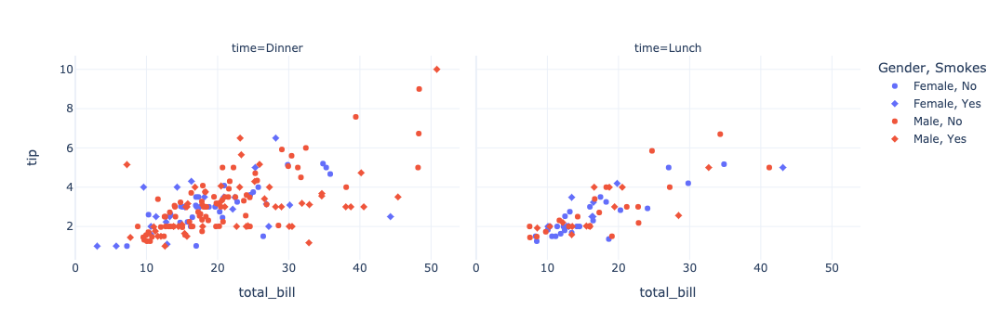

In [187]:
fig = px.scatter(tips, x='total_bill', y='tip',
                 color='sex', symbol='smoker', facet_col='time',
                 labels={'sex':'Gender', 'smoker':'Smokes'})
fig.show()

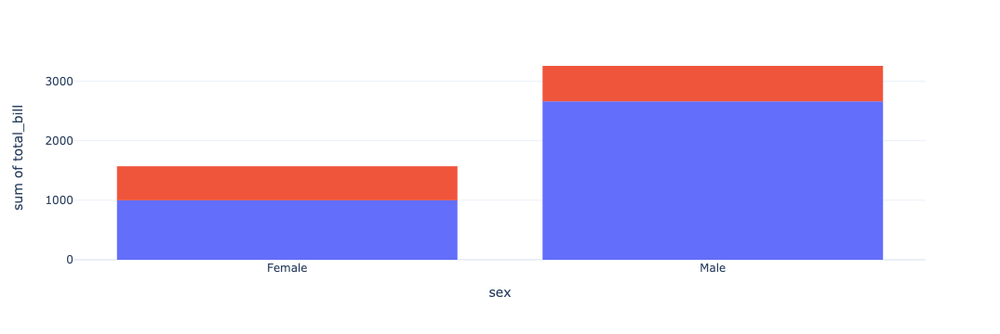

In [188]:
fig = px.histogram(tips, x='sex', y='total_bill', color='time')
fig.update_layout(showlegend=False) # 범례 감추기 
fig.show()

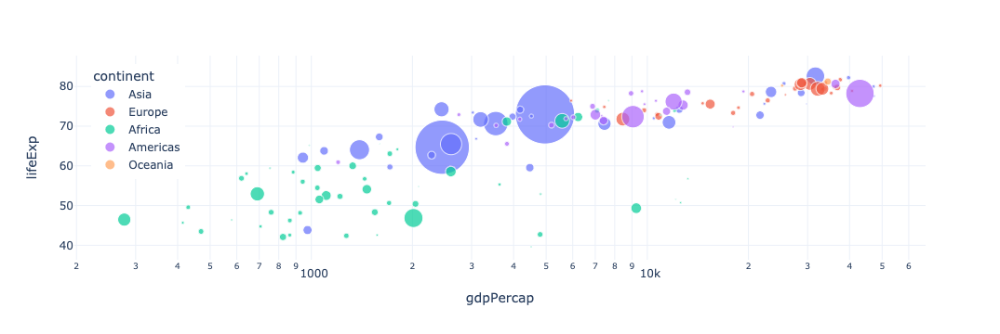

In [189]:
fig = px.scatter(gapminder_2007, x='gdpPercap', y='lifeExp', 
                 color='continent', size='pop',size_max=45, log_x=True)
fig.update_layout(legend=dict(yanchor='top', y=0.96,xanchor='left', x=0.02))
fig.show()
                  

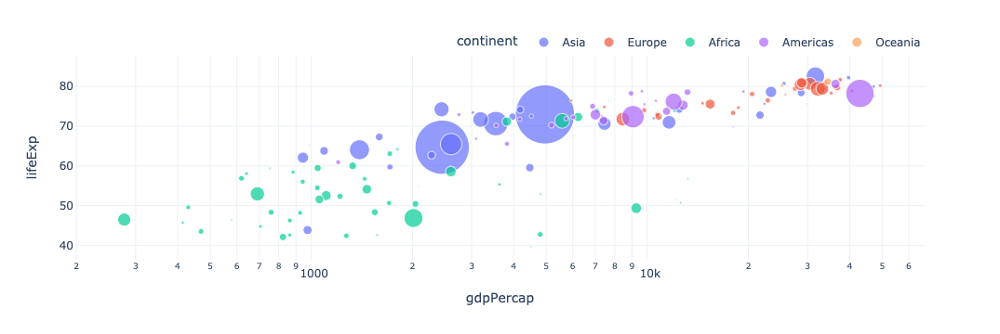

In [190]:
fig.update_layout(legend=dict(orientation='h',
                              yanchor='bottom', y=1,
                              xanchor='right', x=1))
fig.show()
                  

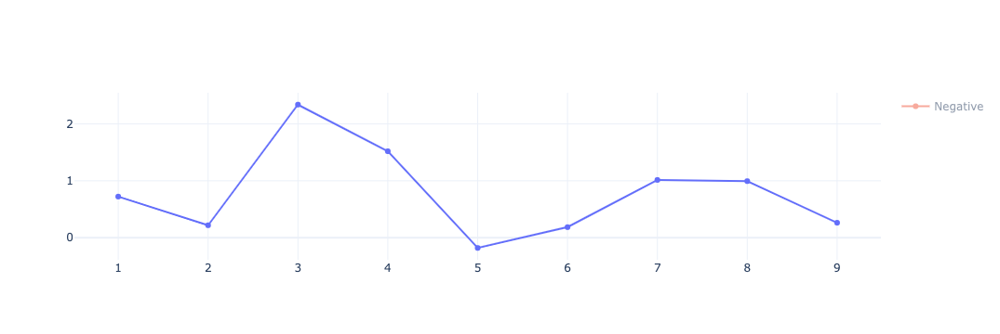

In [191]:
fig =go.Figure()
fig.add_trace(go.Scatter(x=np.arange(1,10),
                         y=np.random.randn(10) +1,
                         showlegend=False, #범례삭제 
                         name="Positive")) 
fig.add_trace(go.Scatter(x=np.arange(1,10),
                         y=np.random.randn(10) -1,
                         visible='legendonly', # 초기에는 안보이게 했다가 클릭해야 보임 
                         name="Negative"))
fig.show()

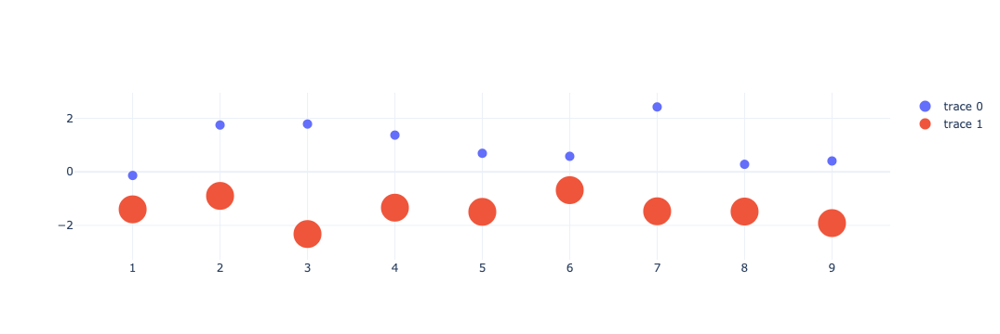

In [192]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=np.arange(1,10),
                         y=np.random.randn(10)+1,
                         mode='markers',
                         marker={'size':10}))
fig.add_trace(go.Scatter(x=np.arange(1,10),
                         y=np.random.randn(10)-1,
                         mode='markers',
                         marker={'size':30}))
fig.update_layout(legend={'itemsizing': 'constant'}) #범례에 사이즈를 지정해서 보여줌 
fig.show()

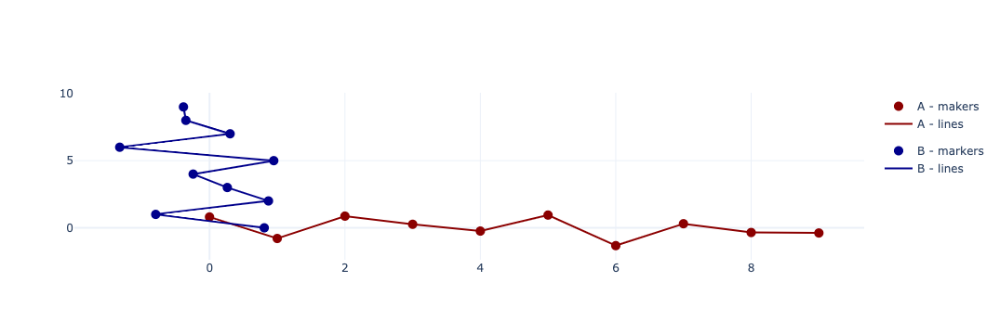

In [193]:
x = np.arange(20)
y = np.random.randn(10)

fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=y,
                         legendgroup='Group A',
                         name='A - makers',
                         mode='markers',
                         marker=dict(color='darkred',size=10)))
fig.add_trace(go.Scatter(x=x, y=y,
                         legendgroup='Group A',
                         name='A - lines',
                         mode='lines',
                         marker=dict(color='darkred')))
fig.add_trace(go.Scatter(x=y, y=x,
                         legendgroup='Group B',
                         name='B - markers',
                         mode='markers',
                         marker=dict(color='darkblue',size=10)))
fig.add_trace(go.Scatter(x=y, y=x,
                         legendgroup='Group B',
                         name='B - lines',
                         mode='lines',
                         marker=dict(color='darkblue')))
fig.update_layout()
fig.show()
# 범례 그룹화 


### 다중 축(Multiple Axes)

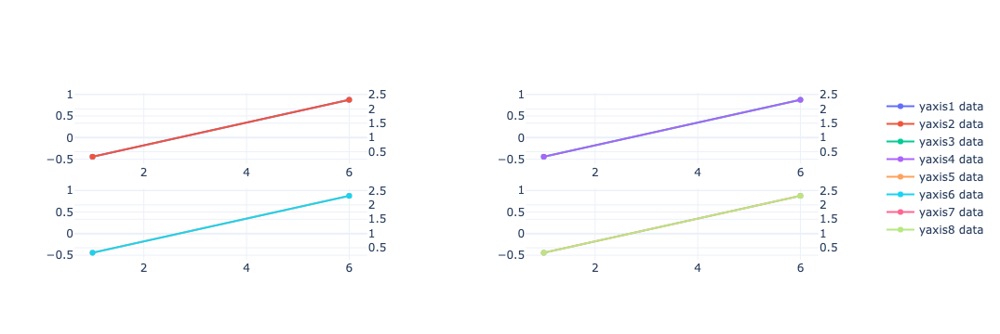

In [194]:
x = np.arange(1, 10, 5)
y1 = np.random.randn(5)
y2 = np.random.randn(5).cumsum()

fig = make_subplots(rows=2, cols=2,
                    specs=[[{'secondary_y':True}, {'secondary_y':True}],
                           [{'secondary_y':True}, {'secondary_y':True}]])

fig.add_trace(go.Scatter(x=x, y=y1, name='yaxis1 data'),
              row=1, col=1, secondary_y=False)
fig.add_trace(go.Scatter(x=x, y=y2, name='yaxis2 data'),
              row=1, col=1, secondary_y=True)

fig.add_trace(go.Scatter(x=x, y=y1, name='yaxis3 data'),
              row=1, col=2, secondary_y=False)
fig.add_trace(go.Scatter(x=x, y=y2, name='yaxis4 data'),
              row=1, col=2, secondary_y=True)

fig.add_trace(go.Scatter(x=x, y=y1, name='yaxis5 data'),
              row=2, col=1, secondary_y=False)
fig.add_trace(go.Scatter(x=x, y=y2, name='yaxis6 data'),
              row=2, col=1, secondary_y=True)

fig.add_trace(go.Scatter(x=x, y=y1, name='yaxis7 data'),
              row=2, col=2, secondary_y=False)
fig.add_trace(go.Scatter(x=x, y=y2, name='yaxis8 data'),
              row=2, col=2, secondary_y=True)
# secondary_y True만 출력 
fig.show()

### 서브플롯(Subplots)

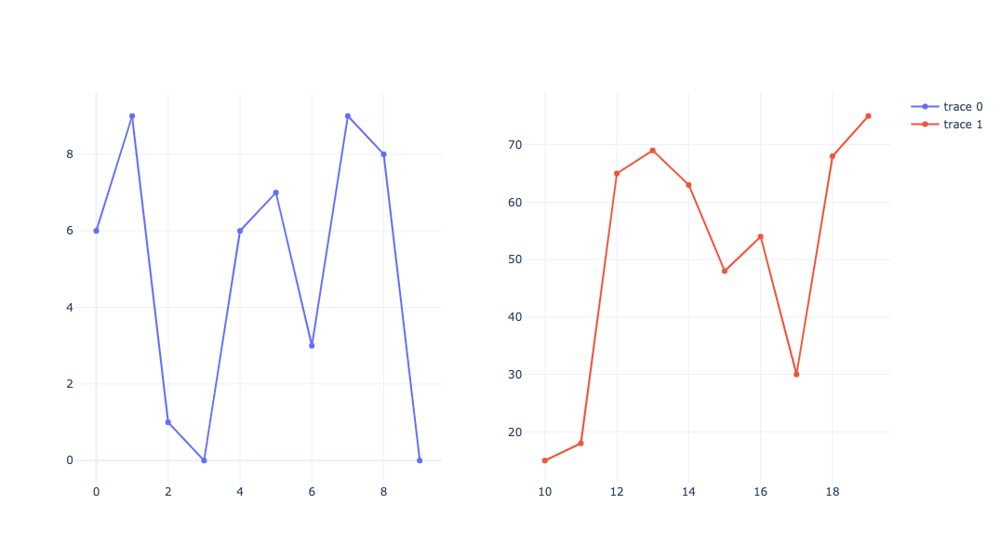

In [195]:
x1 = np.arange(0, 11)
y1 = np.random.randint(0,10,10)

x2 = np.arange(10, 21)
y2 = np.random.randint(10,100,10)

x3 = np.arange(20, 31)
y3 = np.random.randint(100,1000,10)

x4 = np.arange(30, 41)
y4 = np.random.randint(1000,10000,10)

fig = make_subplots(rows=1, cols=2)
fig.add_trace(go.Scatter(x=x1, y=y1), row=1, col=1)
fig.add_trace(go.Scatter(x=x2, y=y2), row=1, col=2)
fig.update_layout(height=600, width=800)
fig.show()



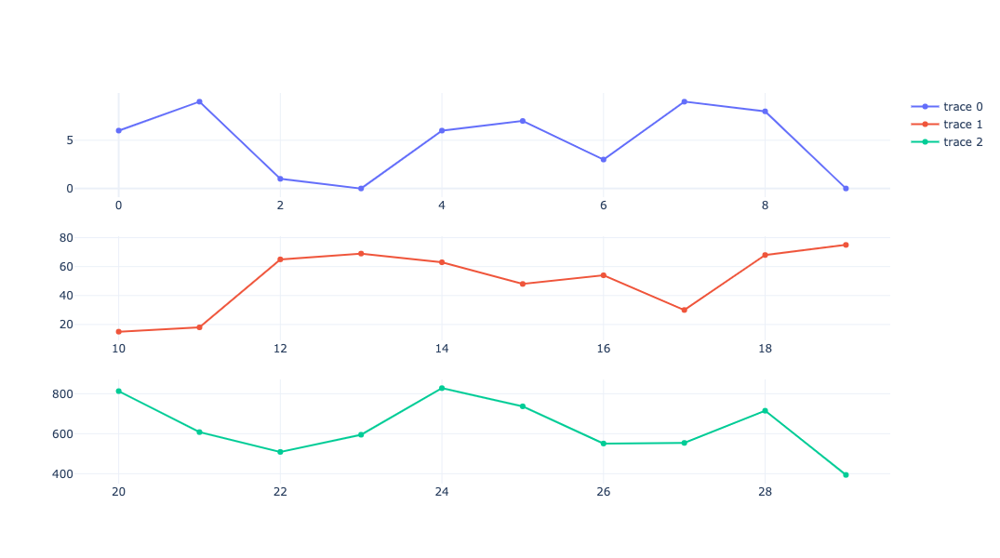

In [196]:

fig = make_subplots(rows=3, cols=1)
fig.add_trace(go.Scatter(x=x1, y=y1), row=1, col=1)
fig.add_trace(go.Scatter(x=x2, y=y2), row=2, col=1)
fig.add_trace(go.Scatter(x=x3, y=y3), row=3, col=1)
fig.update_layout(height=600, width=800)
fig.show()

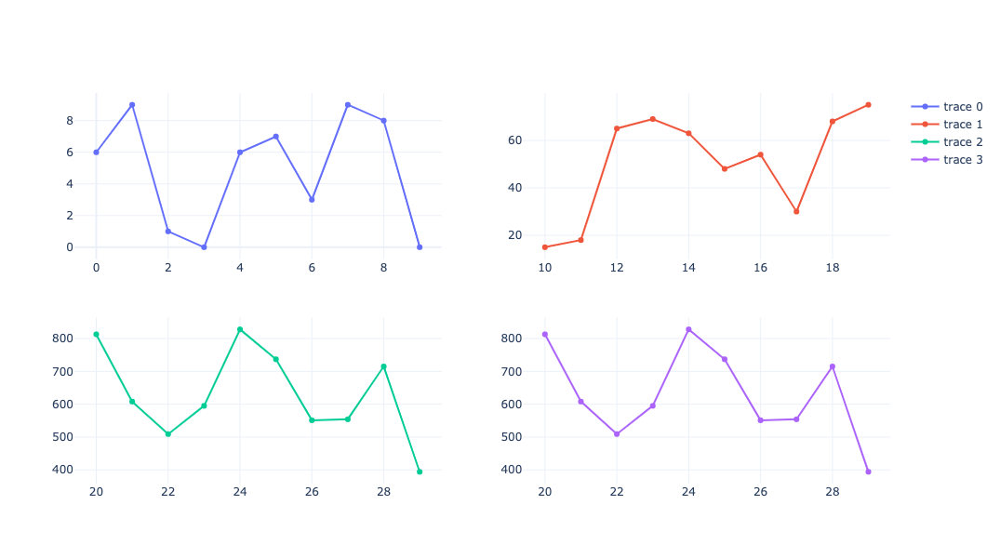

In [197]:
fig = make_subplots(rows=2, cols=2)
fig.add_trace(go.Scatter(x=x1, y=y1), row=1, col=1)
fig.add_trace(go.Scatter(x=x2, y=y2), row=1, col=2)
fig.add_trace(go.Scatter(x=x3, y=y3), row=2, col=1)
fig.add_trace(go.Scatter(x=x3, y=y3), row=2, col=2)
fig.update_layout(height=600, width=800)
fig.show()

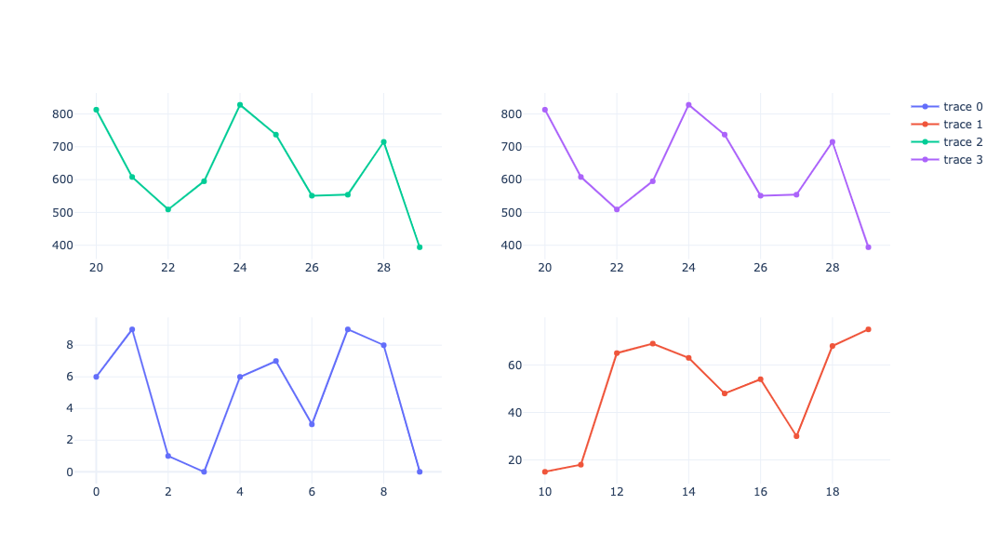

In [198]:
fig = make_subplots(rows=2, cols=2, start_cell='bottom-left')# 시작점 지정
fig.add_trace(go.Scatter(x=x1, y=y1), row=1, col=1)
fig.add_trace(go.Scatter(x=x2, y=y2), row=1, col=2)
fig.add_trace(go.Scatter(x=x3, y=y3), row=2, col=1)
fig.add_trace(go.Scatter(x=x3, y=y3), row=2, col=2)
fig.update_layout(height=600, width=800)
fig.show()

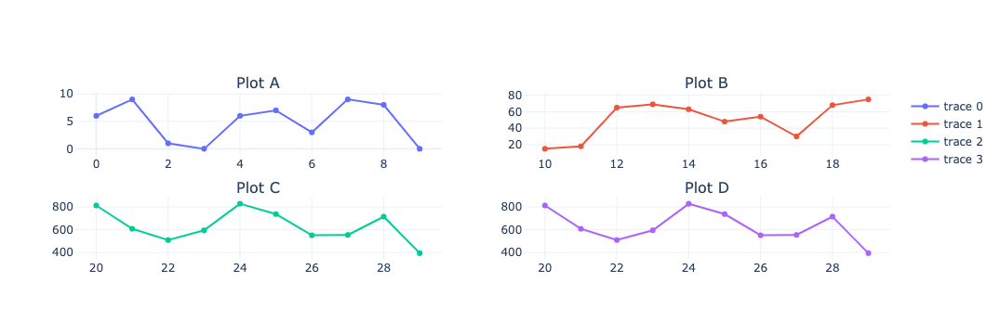

In [199]:
fig = make_subplots(rows=2, cols=2, subplot_titles=('Plot A', 'Plot B', 'Plot C', 'Plot D'))
fig.add_trace(go.Scatter(x=x1, y=y1), row=1, col=1)
fig.add_trace(go.Scatter(x=x2, y=y2), row=1, col=2)
fig.add_trace(go.Scatter(x=x3, y=y3), row=2, col=1)
fig.add_trace(go.Scatter(x=x3, y=y3), row=2, col=2)

fig.show()

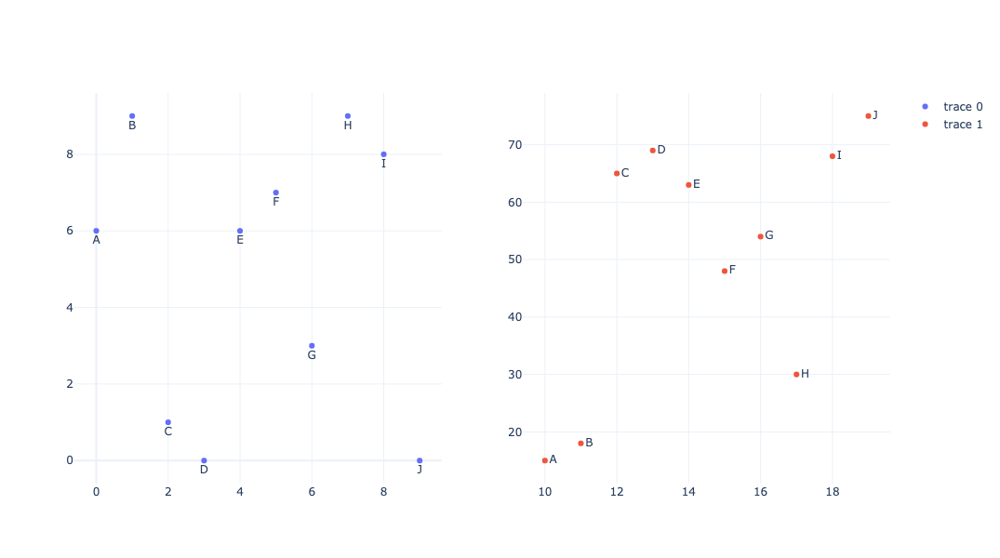

In [200]:
fig = make_subplots(rows=1, cols=2)
fig.add_trace(go.Scatter(x=x1, y=y1,
                         mode='markers+text',
                         text=['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J'],
                         textposition='bottom center'),
              row=1, col=1)
fig.add_trace(go.Scatter(x=x2, y=y2,
                         mode='markers+text',
                         text=['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J'],
                         textposition='middle right'),
              row=1, col=2)
fig.update_layout(height=600, width=800)
fig.show()
# point 밑에 annotaion 같이뜸 


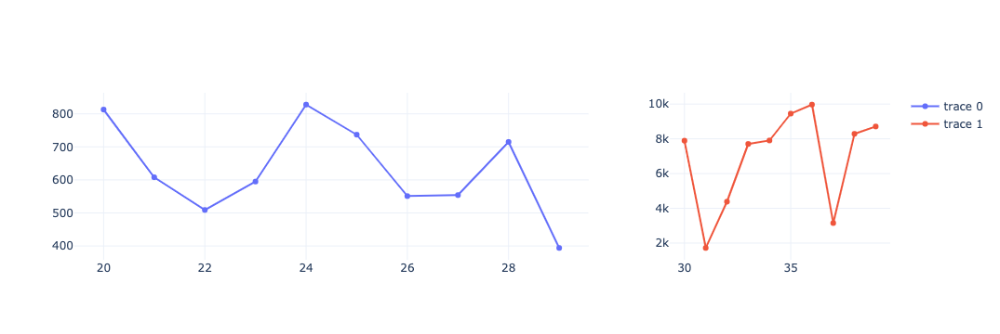

In [201]:
fig = make_subplots(rows=1, cols=2, column_width=[0.7, 0.3])
fig.add_trace(go.Scatter(x=x3, y=y3), row=1, col=1)
fig.add_trace(go.Scatter(x=x4, y=y4), row=1, col=2)
fig.show()

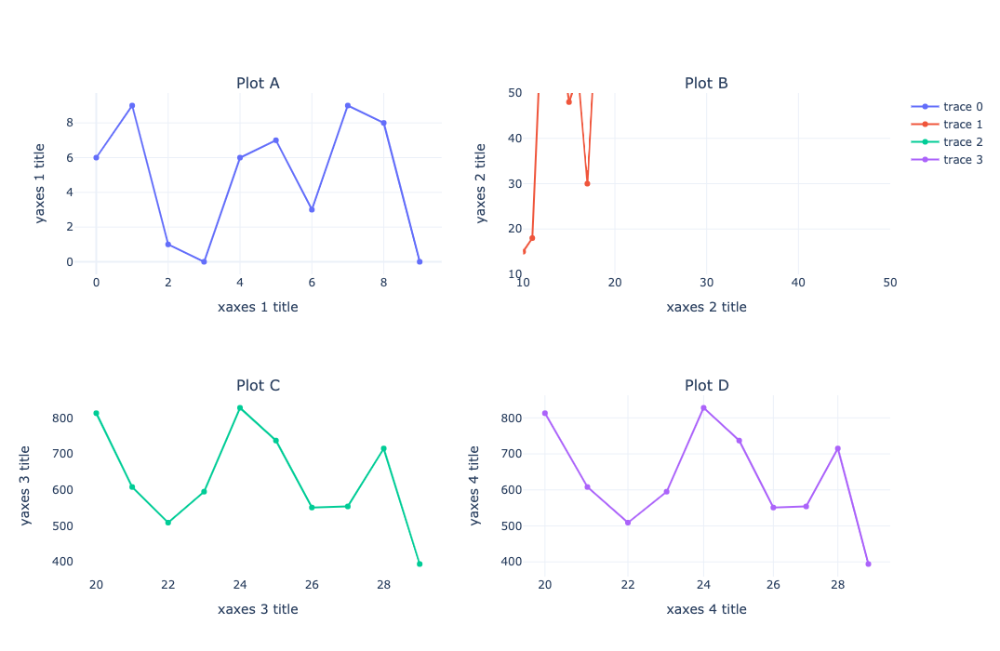

In [202]:
fig = make_subplots(rows=2, cols=2, subplot_titles=('Plot A', 'Plot B', 'Plot C', 'Plot D'))
fig.add_trace(go.Scatter(x=x1, y=y1), row=1, col=1)
fig.add_trace(go.Scatter(x=x2, y=y2), row=1, col=2)
fig.add_trace(go.Scatter(x=x3, y=y3), row=2, col=1)
fig.add_trace(go.Scatter(x=x3, y=y3), row=2, col=2)
fig.update_xaxes(title_text='xaxes 1 title', row=1, col=1)
fig.update_xaxes(title_text='xaxes 2 title', range=[10,50],row=1, col=2)
fig.update_xaxes(title_text='xaxes 3 title', showgrid=False, row=2, col=1)
fig.update_xaxes(title_text='xaxes 4 title', type='log',row=2, col=2)
fig.update_yaxes(title_text='yaxes 1 title', row=1, col=1)
fig.update_yaxes(title_text='yaxes 2 title', range=[10,50],row=1, col=2)
fig.update_yaxes(title_text='yaxes 3 title', showgrid=False, row=2, col=1)
fig.update_yaxes(title_text='yaxes 4 title', row=2, col=2)
fig.update_layout(height=700)


fig.show()

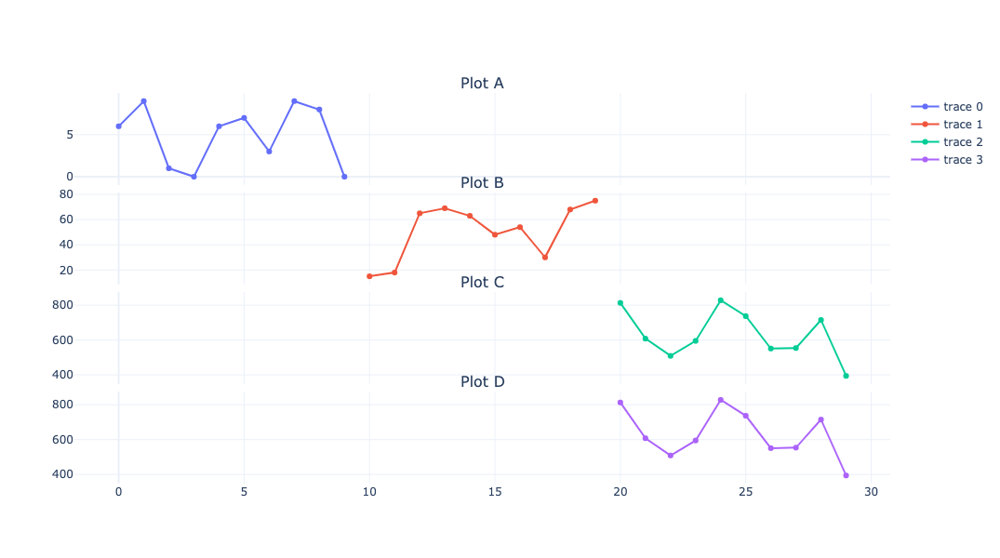

In [203]:
fig = make_subplots(rows=4, cols=1, subplot_titles=('Plot A', 'Plot B', 'Plot C', 'Plot D'),
                   shared_xaxes=True,
                   vertical_spacing=0.02)
fig.add_trace(go.Scatter(x=x1, y=y1), row=1, col=1)
fig.add_trace(go.Scatter(x=x2, y=y2), row=2, col=1)
fig.add_trace(go.Scatter(x=x3, y=y3), row=3, col=1)
fig.add_trace(go.Scatter(x=x3, y=y3), row=4, col=1)
fig.update_layout(height=600, width=600)
fig.show()

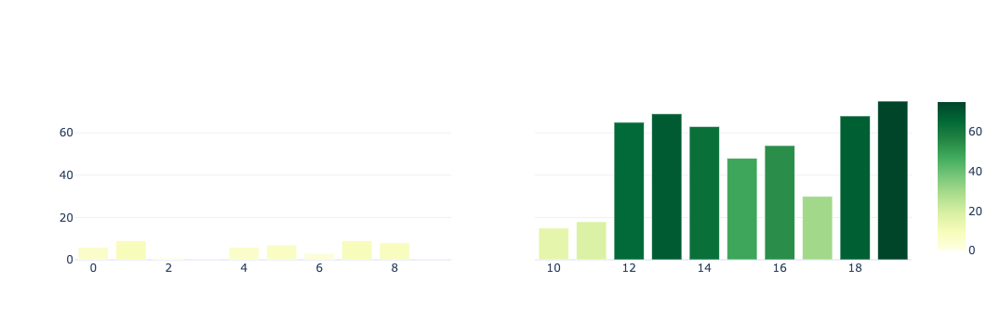

In [204]:
fig = make_subplots(rows=1, cols=2, shared_yaxes=True)
fig.add_trace(go.Bar(x=x1, y=y1, 
                     marker=dict(color=y1, coloraxis='coloraxis')), 1, 1) # row col 간단하게 넣을수있음
fig.add_trace(go.Bar(x=x2, y=y2, 
                     marker=dict(color=y2, coloraxis='coloraxis')), 1, 2) # row col 간단하게 넣을수있음
fig.update_layout(coloraxis=dict(colorscale='YlGn'), showlegend=False)
fig.show()

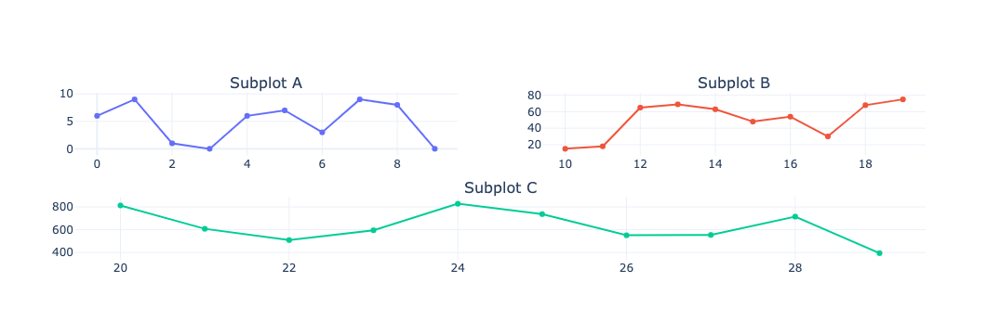

In [205]:
fig = make_subplots(rows=2, cols=2, specs=[[{}, {}],[{'colspan':2},None]],
                    subplot_titles=('Subplot A', 'Subplot B', 'Subplot C')) # 2x2 인데 3번째 4번째합침
fig.add_trace(go.Scatter(x=x1, y=y1), 1, 1)
fig.add_trace(go.Scatter(x=x2, y=y2), 1, 2)
fig.add_trace(go.Scatter(x=x3, y=y3), 2, 1)
fig.update_layout(showlegend=False)
fig.show()


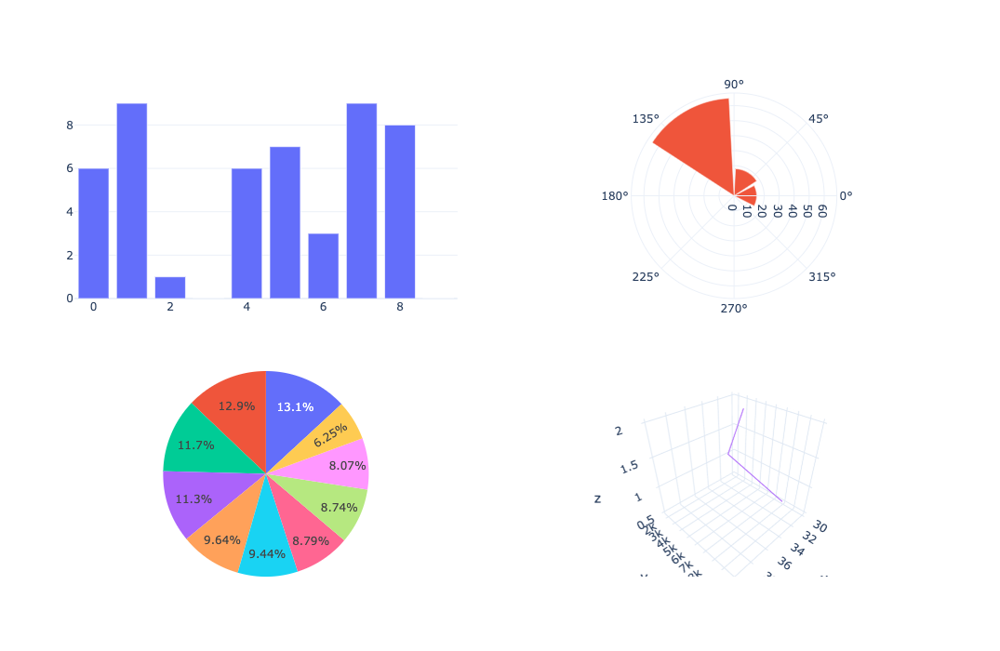

In [206]:
fig = make_subplots(rows=2, cols=2,
                    specs=[[{'type':'xy'}, {'type':'polar'}],
                           [{'type':'domain'}, {'type':'scene'}]])
fig.add_trace(go.Bar(y=y1), row=1, col=1)
fig.add_trace(go.Barpolar(theta=[0, 60, 120], r= y2), row=1, col=2)
fig.add_trace(go.Pie(values=y3), row=2, col=1)
fig.add_trace(go.Scatter3d(x=x4, y=y4, z=[0.5, 1, 2], mode='lines'), row=2, col=2)
fig.update_layout(height=700, showlegend=False)
fig.show()



### 다중 차트 유형(Multiple Chart Types)

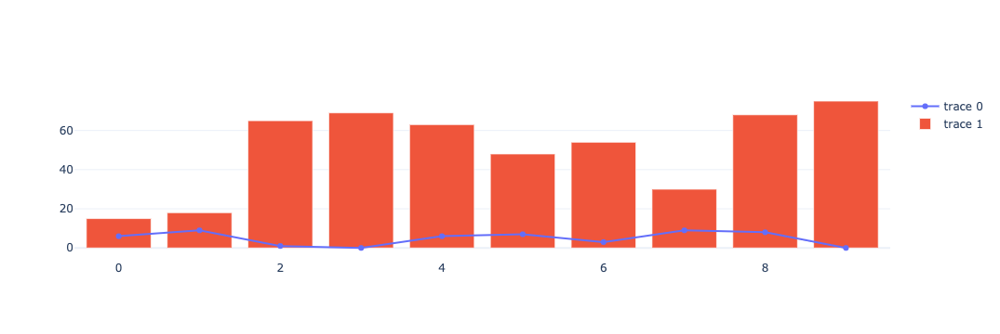

In [207]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=x1, y=y1))
fig.add_trace(go.Bar(x=x1, y=y2))
fig.show()

### 인수(Arguments)

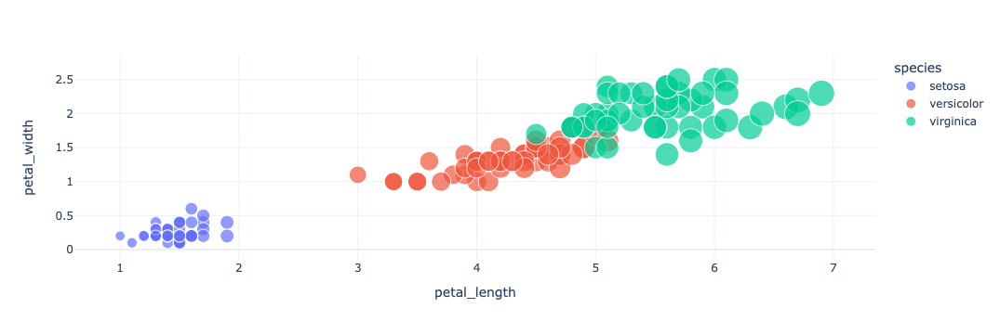

In [208]:
fig = px.scatter(iris, x=iris.petal_length, y=iris.petal_width, 
                 color=iris.species, size=iris.petal_length)
fig.show()

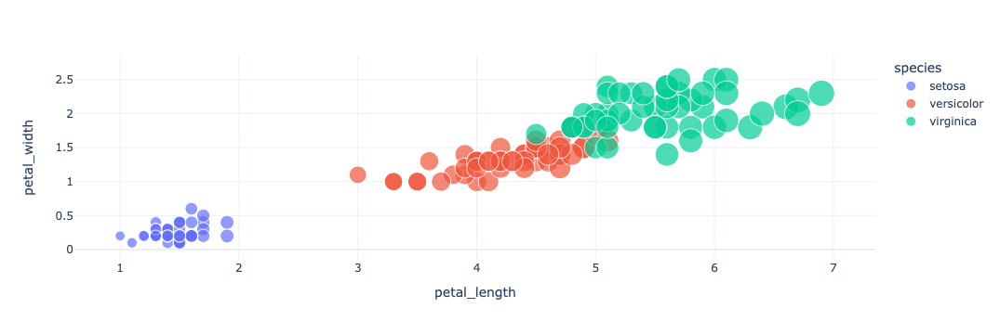

In [209]:
fig = px.scatter(iris, x='petal_length', y='petal_width',
                 color='species', size='petal_length')
fig.show()

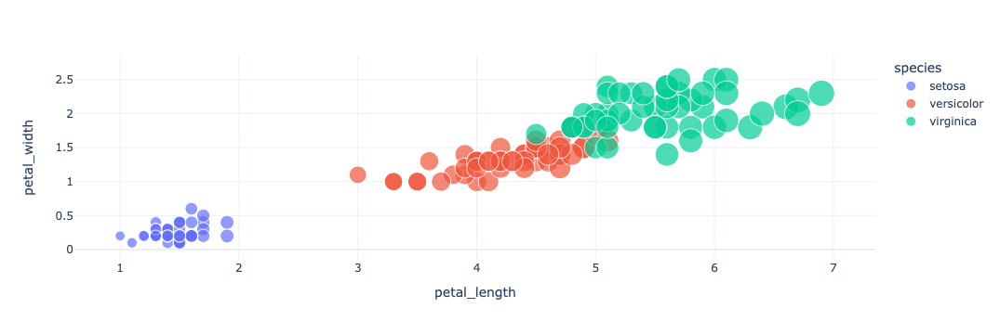

In [210]:
fig = px.scatter(iris, x=iris.petal_length, y=iris.petal_width, 
                 color=iris.species, size=iris.petal_length,
                hover_data=[iris.index])
fig.show()

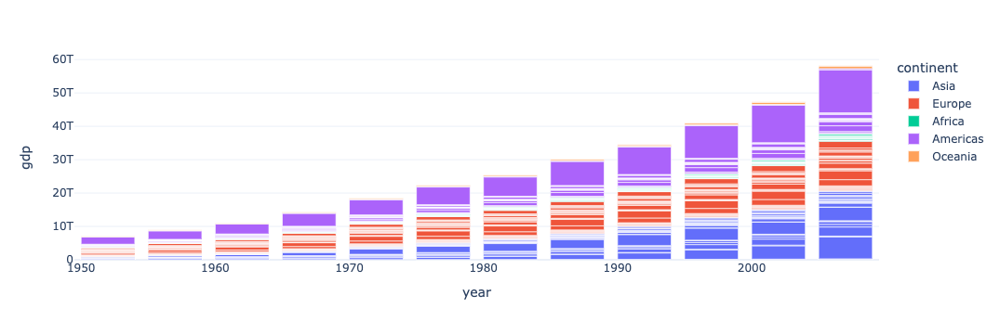

In [211]:
gdp = gapminder['pop'] * gapminder['gdpPercap']
fig = px.bar(gapminder, x='year', y=gdp, color='continent', labels={'y':'gdp'},
             hover_data=['country'])
fig.show()
# labels 사용해서 전달함 

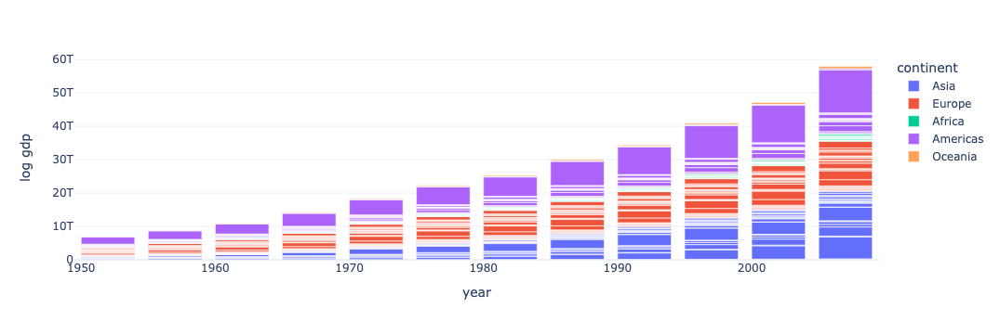

In [212]:
gdp = gapminder['pop'] * gapminder['gdpPercap']
fig = px.bar(gapminder, x='year', y=gdp, color='continent', labels={'y':'log gdp'},
             hover_data=['country'])
fig.show()

### 마커 스타일(Styling Markers)

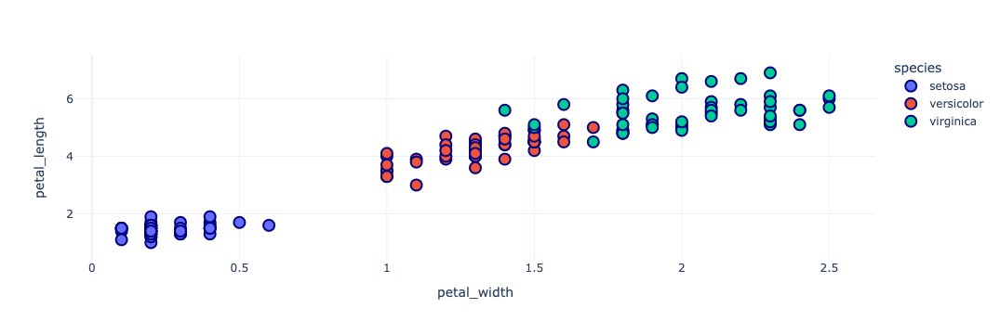

In [213]:
fig = px.scatter(iris, x='petal_width', y='petal_length', color='species')
fig.update_traces(marker=dict(size=12, line=dict(width=2, color='navy')),
                 selector=dict(mode='markers'))
fig.show()

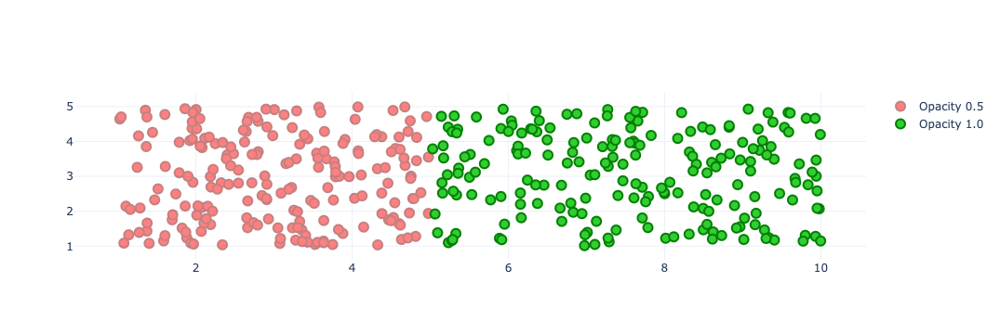

In [214]:
x1 = np.random.uniform(low=1, high=5, size=(200))
y1 = np.random.uniform(low=1, high=5, size=(200))
x2 = np.random.uniform(low=5, high=10, size=(200))
y2 = np.random.uniform(low=1, high=5, size=(200))

fig= go.Figure()
fig.add_traces(go.Scatter(x=x1, y=y1, mode='markers', opacity=0.5,
                          marker=dict(color='red', size=10, line=dict(color='darkred', width=2)),
                          name='Opacity 0.5'))
fig.add_traces(go.Scatter(x=x2, y=y2, mode='markers',
                          marker=dict(color='limegreen', size=10, line=dict(color='green', width=2)),
                          name='Opacity 1.0'))
fig.show()
                          

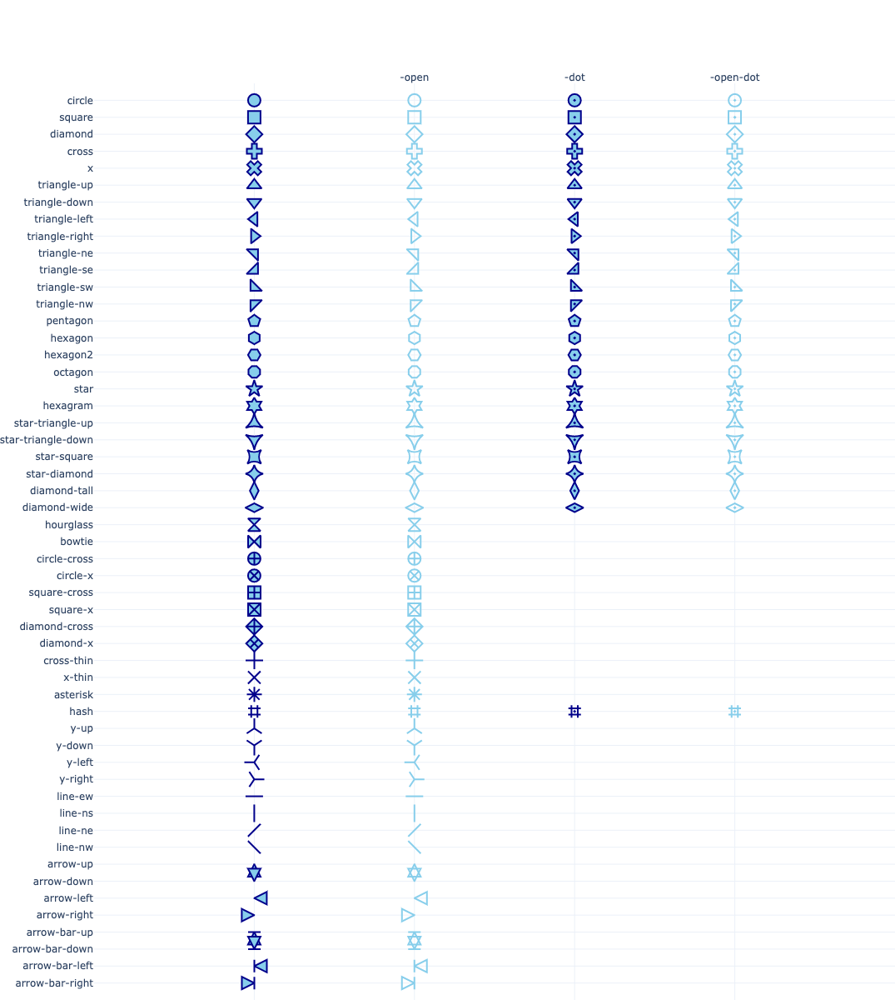

In [215]:
raw_symbols = SymbolValidator().values
namestems = []
namevariants = []
symbols = []

for i in range(0, len(raw_symbols), 3):
    name = raw_symbols[i + 2]
    symbols.append(raw_symbols[i])
    namestems.append(name.replace("-open", "").replace("-dot",""))
    namevariants.append(name[len(namestems[-1]):])

fig = go.Figure(go.Scatter(mode='markers', x= namevariants, y=namestems, marker_symbol=symbols,
                           marker_line_color='darkblue', marker_color='skyblue',
                           marker_line_width=2, marker_size=15,
                           hovertemplate="%{y}%{x}(num: %{marker.symbol})"))
fig.update_layout(xaxis_range=[-1, 4], yaxis_range=[len(set(namestems)), -1],
                  margin=dict(b=0, r=0), xaxis_side='top', height=1200, width=400)
fig.show()


### 색상 척도 및 색상 막대

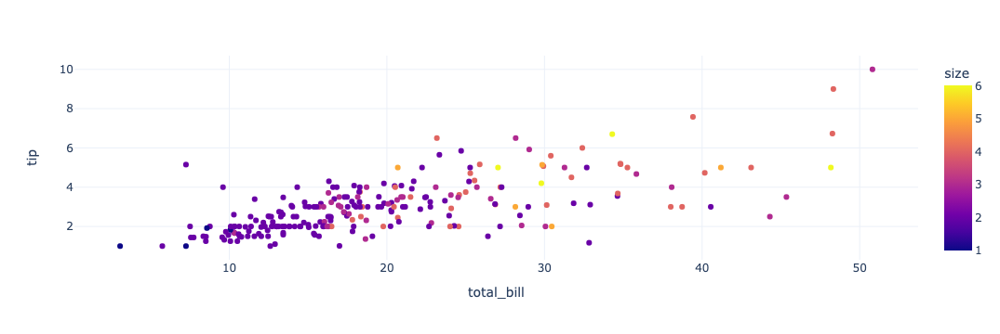

In [218]:
fig = px.scatter(tips, x=
                 'total_bill', y='tip', color='size')
fig.show()
                 

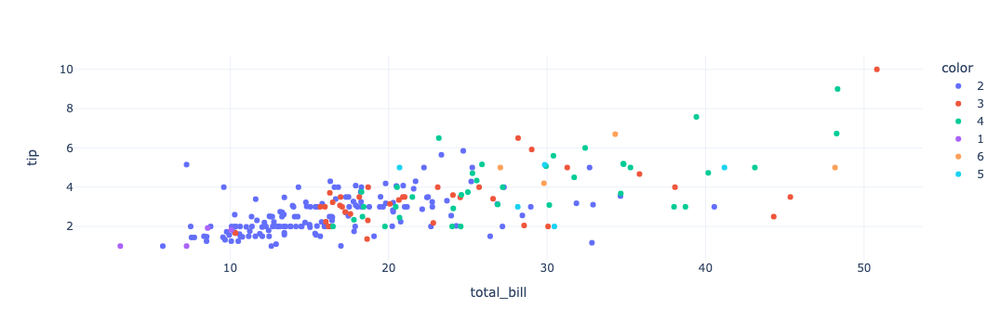

In [221]:
fig = px.scatter(tips, x=
                 'total_bill', y='tip', color=tips['size'].astype(str)) #data type을 str로 
fig.show()

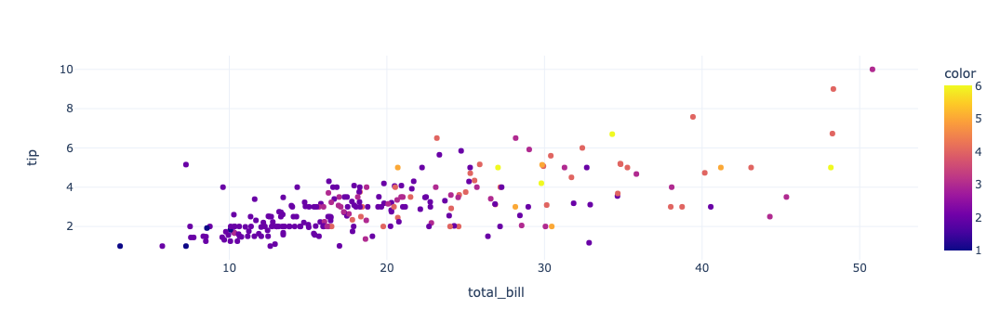

In [222]:
fig = px.scatter(tips, x=
                 'total_bill', y='tip', color=tips['size'].astype(float))
fig.show()

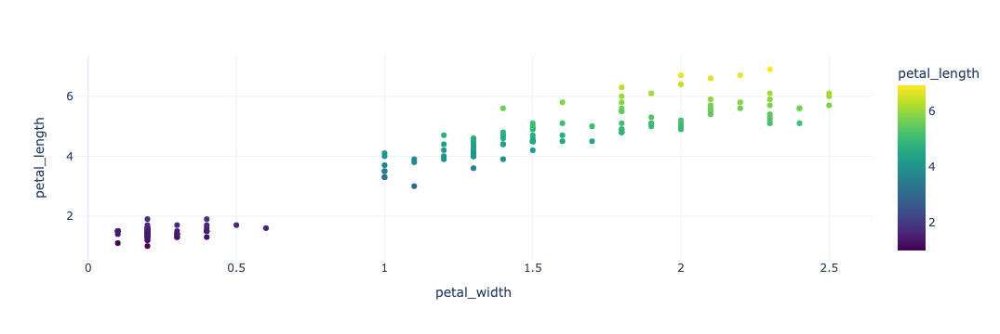

In [227]:
fig = px.scatter(iris, x='petal_width', y='petal_length', color='petal_length',
                 color_continuous_scale=px.colors.sequential.Viridis)
fig.show()

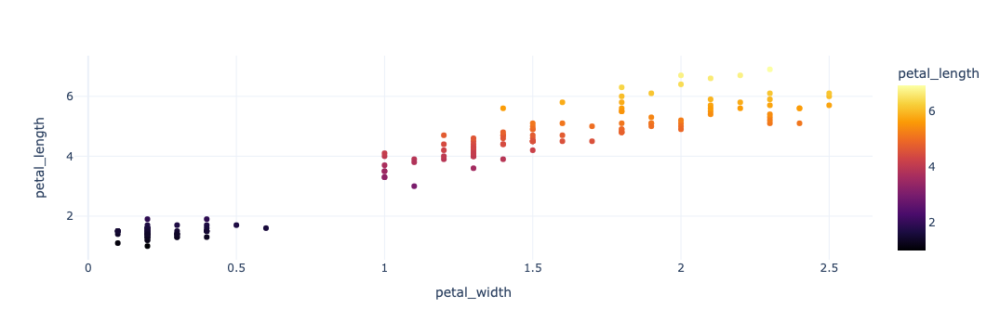

In [230]:
fig = px.scatter(iris, x='petal_width', y='petal_length', color='petal_length',
                 color_continuous_scale='Inferno') #이름 바로지정
fig.show()

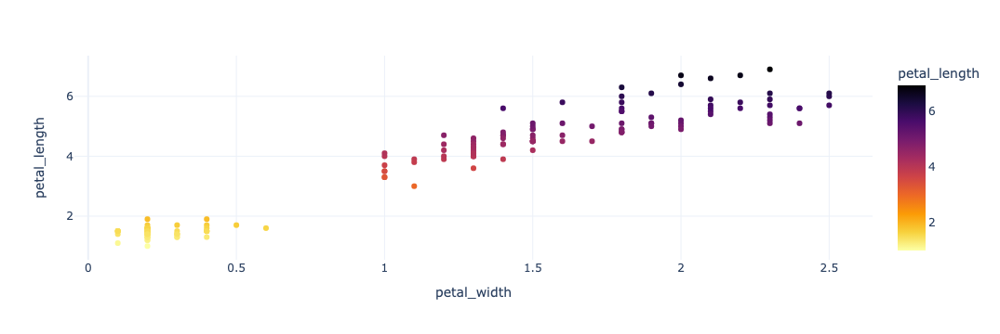

In [231]:
fig = px.scatter(iris, x='petal_width', y='petal_length', color='petal_length',
                 color_continuous_scale='Inferno_r') #reverse
fig.show()

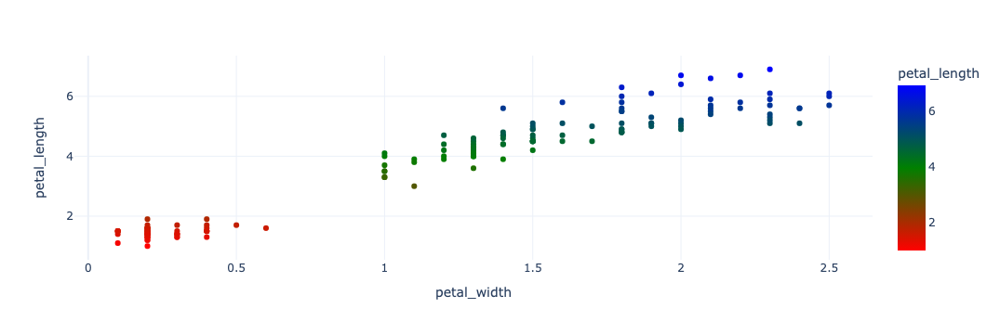

In [232]:
fig = px.scatter(iris, x='petal_width', y='petal_length', color='petal_length',
                 color_continuous_scale=['red','green','blue'])
fig.show()

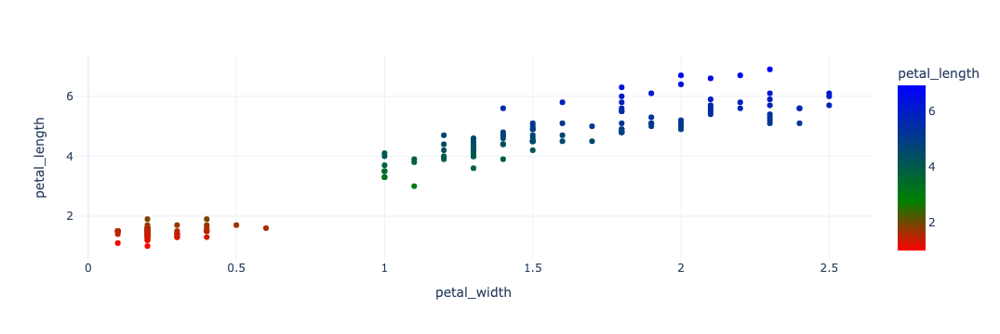

In [233]:
fig = px.scatter(iris, x='petal_width', y='petal_length', color='petal_length',
                 color_continuous_scale=[(0,'red'),(0.3,'green'),(1,'blue')])
fig.show()

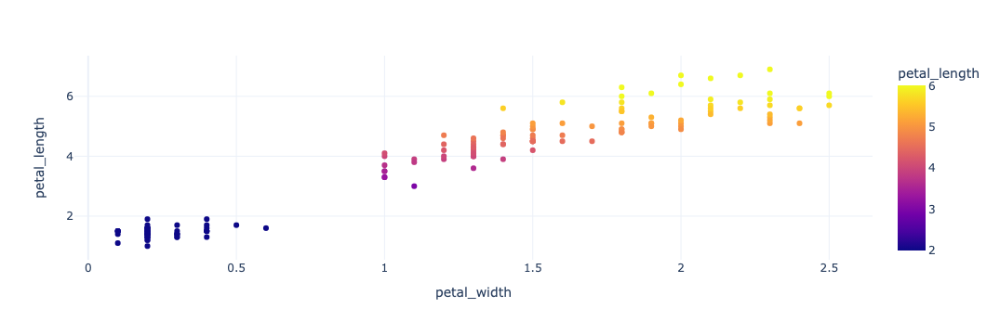

In [234]:
fig = px.scatter(iris, x='petal_width', y='petal_length', color='petal_length',
                 range_color=[2,6])
fig.show()

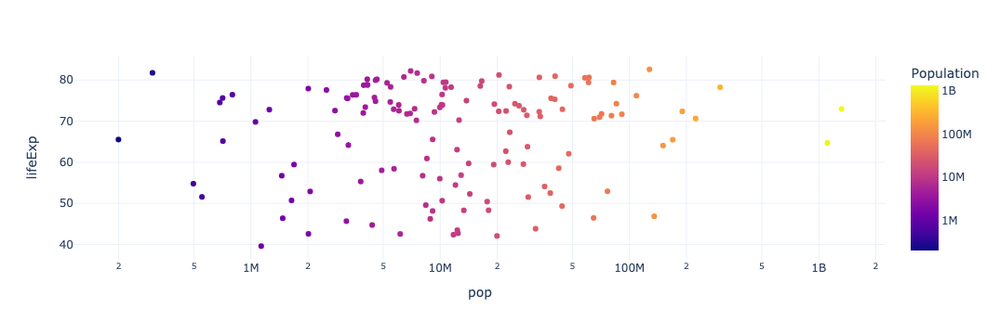

In [235]:
fig = px.scatter(gapminder_2007, y='lifeExp', x='pop',
                 color=np.log10(gapminder_2007['pop']),
                 hover_name='country', log_x=True)
fig.update_layout(coloraxis_colorbar=dict(title='Population', tickvals=[6,7,8,9], ticktext=['1M','10M','100M','1B']
                                         ))
fig.show()
    

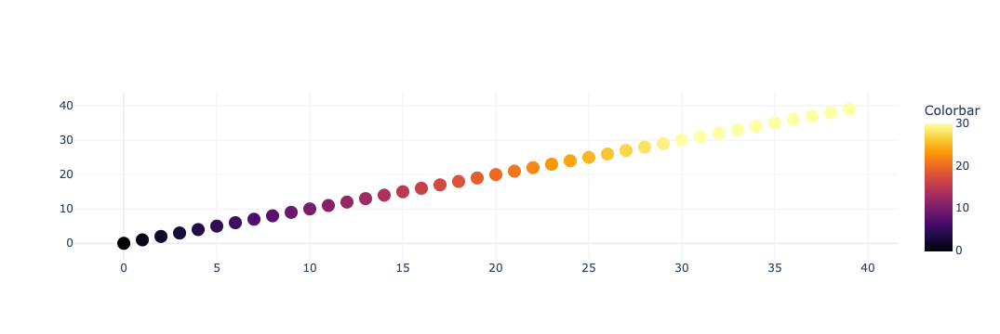

In [237]:
fig = go.Figure()
values = list(range(40))
fig.add_trace(go.Scatter(x=values, y=values,
                         marker=dict(size=14, cmax=30, cmin=0, color=values, colorbar=dict(title='Colorbar'),
                                     colorscale='Inferno'), mode='markers'))
fig.show()

### 텍스트 및 주석(Text and Annotation)

In [240]:
gapminder_asia_2007 = gapminder.query("year==2007 and continent == 'Asia'")
gapminder_asia_2007

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
11,Afghanistan,Asia,2007,43.828,31889923,974.580338,AFG,4
95,Bahrain,Asia,2007,75.635,708573,29796.048340,BHR,48
107,Bangladesh,Asia,2007,64.062,150448339,1391.253792,BGD,50
227,Cambodia,Asia,2007,59.723,14131858,1713.778686,KHM,116
299,China,Asia,2007,72.961,1318683096,4959.114854,CHN,156
671,"Hong Kong, China",Asia,2007,82.208,6980412,39724.978670,HKG,344
707,India,Asia,2007,64.698,1110396331,2452.210407,IND,356
719,Indonesia,Asia,2007,70.650,223547000,3540.651564,IDN,360
731,Iran,Asia,2007,70.964,69453570,11605.714490,IRN,364
743,Iraq,Asia,2007,59.545,27499638,4471.061906,IRQ,368


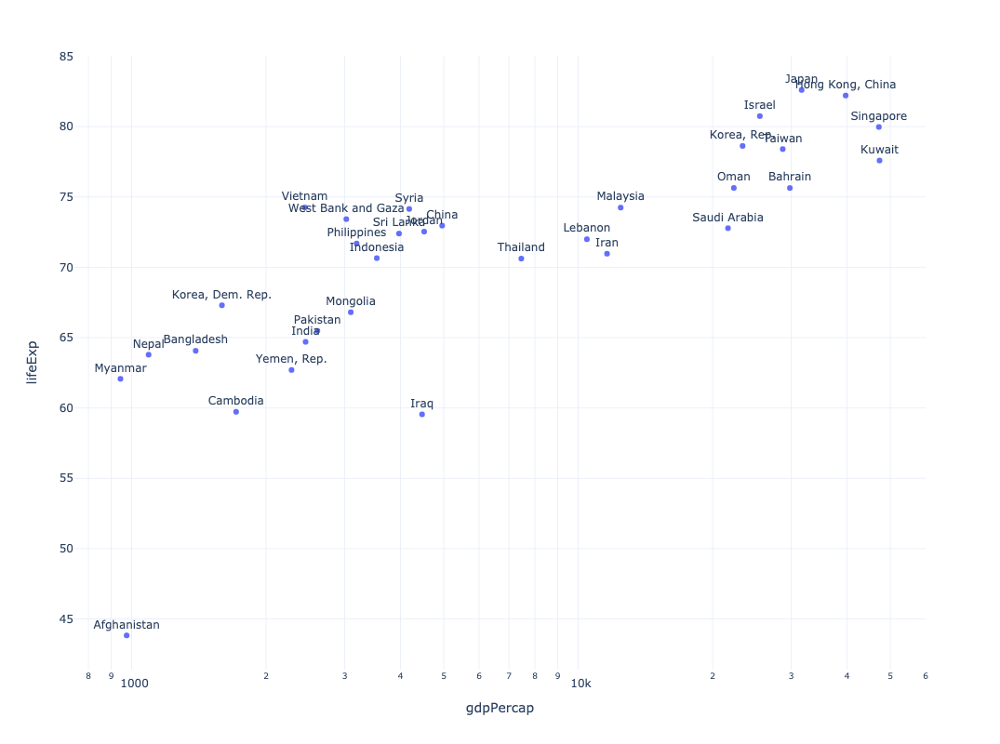

In [243]:
fig = px.scatter(gapminder_asia_2007, x='gdpPercap', y='lifeExp',
                 text='country', log_x=True, size_max=60)
fig.update_traces(textposition='top center')
fig.update_layout(height=800)
fig.show()

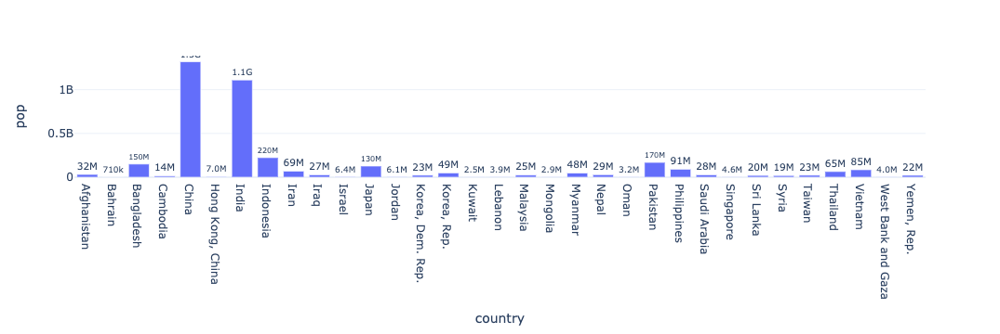

In [245]:
fig = px.bar(gapminder_asia_2007, y='pop', x='country', text='pop')
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout()
fig.show()

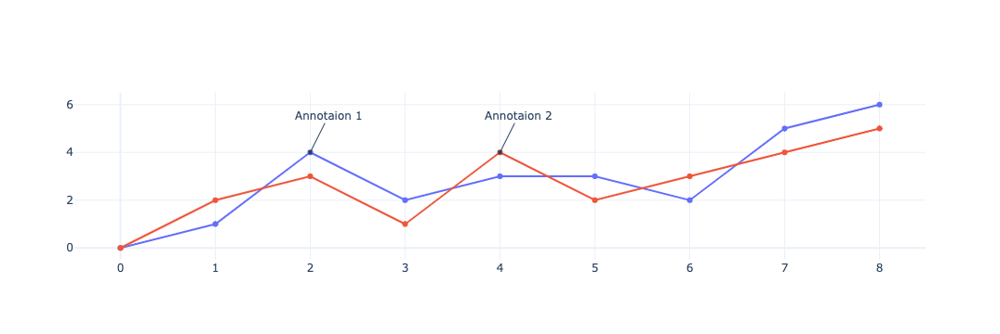

In [249]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=[0,1,2,3,4,5,6,7,8],
                         y=[0,1,4,2,3,3,2,5,6]))
fig.add_trace(go.Scatter(x=[0,1,2,3,4,5,6,7,8],
                         y=[0,2,3,1,4,2,3,4,5]))
fig.add_annotation(x=2,y=4, text='Annotaion 1')
fig.add_annotation(x=4,y=4, text='Annotaion 2')
fig.update_annotations(dict(xref='x', yref='y',
                            showarrow=True, arrowhead=7, ax=20, ay=-40))
fig.update_layout(showlegend=False)
fig.show()




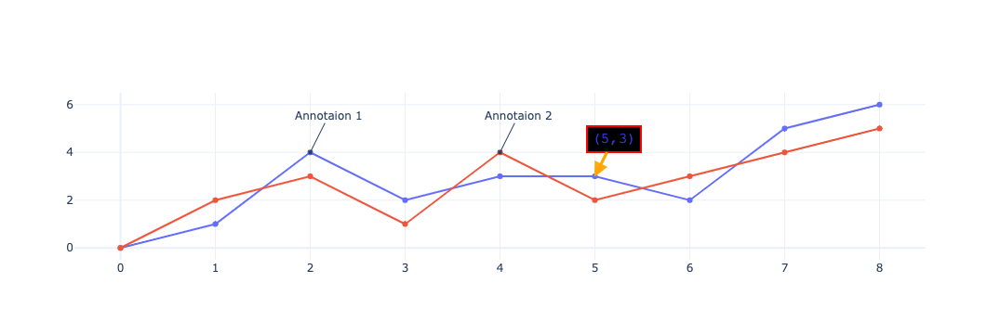

In [256]:
fig.add_annotation(x=5, y=3, xref='x', yref='y',
                   text='(5,3)', showarrow=True,
                   font=dict(family='Courier New, monospace', size=16, color='blue'),
                   align='center', arrowhead=2, arrowsize=1, arrowwidth=3, arrowcolor='orange', ax=20, ay=-40,
                   bordercolor='red',borderwidth=2, borderpad=4, bgcolor='black', opacity=0.8)
fig.update_layout(showlegend=False)
fig.show()

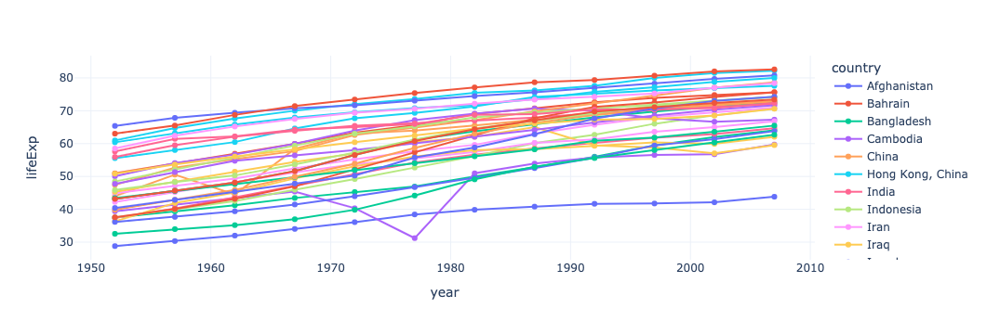

In [258]:
fig = px.line(gapminder_asia, x='year', y='lifeExp', color='country')
fig.update_traces(mode='markers+lines')
fig.show()

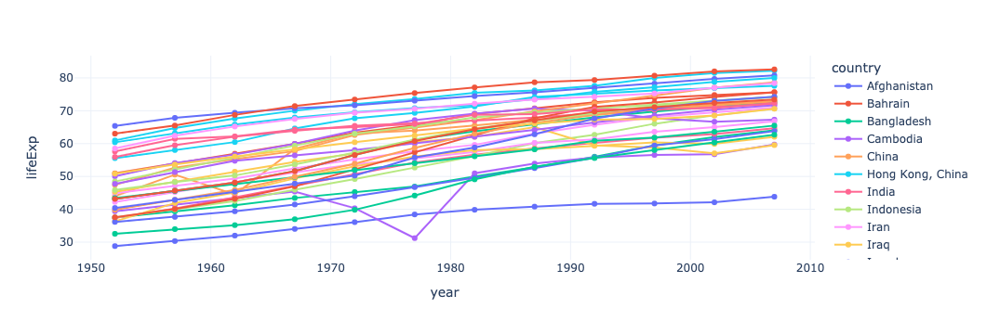

In [264]:
fig.update_traces(mode='markers+lines', hovertemplate=None)
fig.update_layout(hovermode='x')
fig.show()

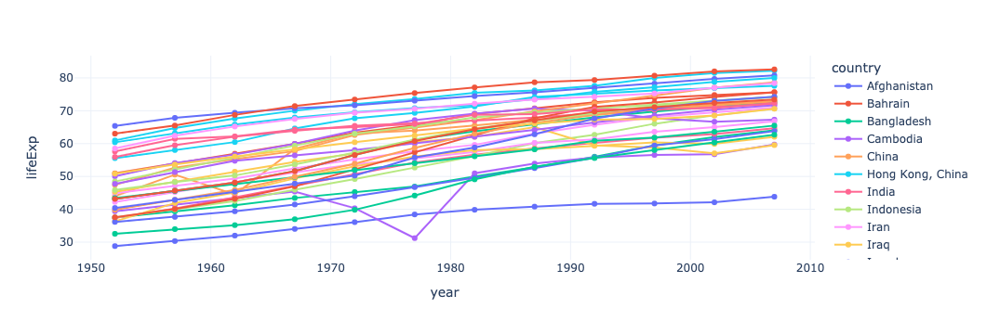

In [266]:
fig.update_traces(mode='markers+lines')
fig.update_layout(hoverlabel=dict(bgcolor='white',
                                 font_size=14,
                                 font_family="Courier New"))

fig.show()

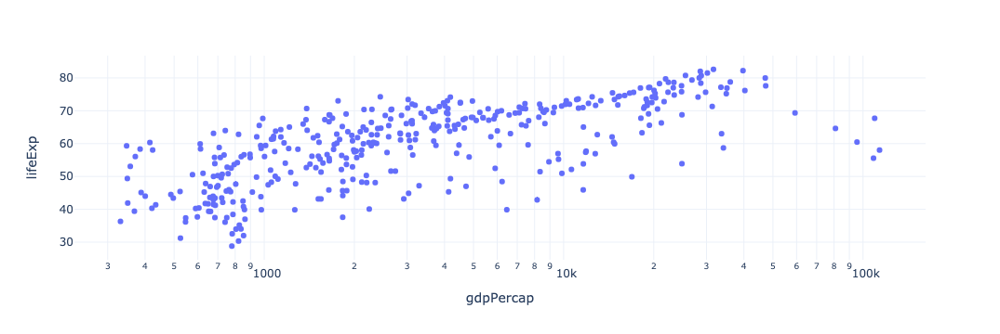

In [267]:
fig = px.scatter(gapminder_asia, x='gdpPercap', y='lifeExp', log_x=True,
                 hover_name='country', hover_data=['continent', 'pop'])
fig.show()

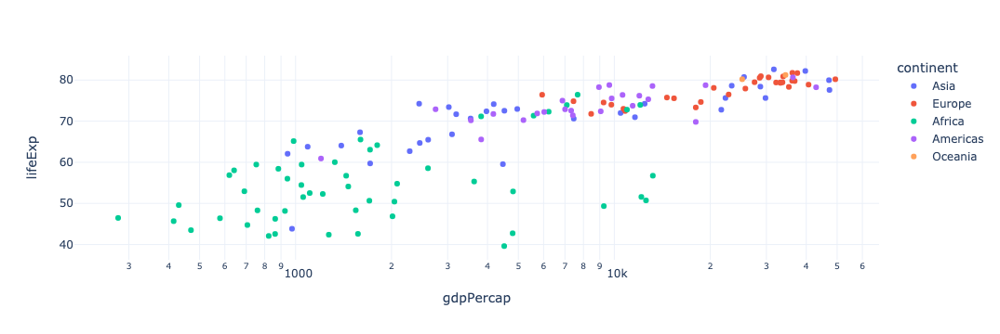

In [272]:
fig = px.scatter(gapminder_2007, x='gdpPercap', y='lifeExp', log_x=True,
                 color='continent')
fig.update_traces(hovertemplate='GDP: %{x} <br> Life Expentancy : %{y}')

fig.show()

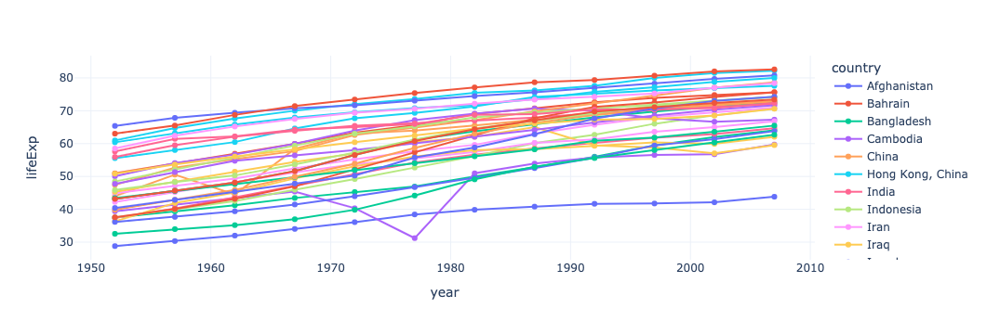

In [273]:
fig = px.line(gapminder_asia, x='year', y='lifeExp', color='country')
fig.update_traces(mode='markers+lines')
fig.update_xaxes(showspikes=True)
fig.update_yaxes(showspikes=True)# 안내선 
fig.show()

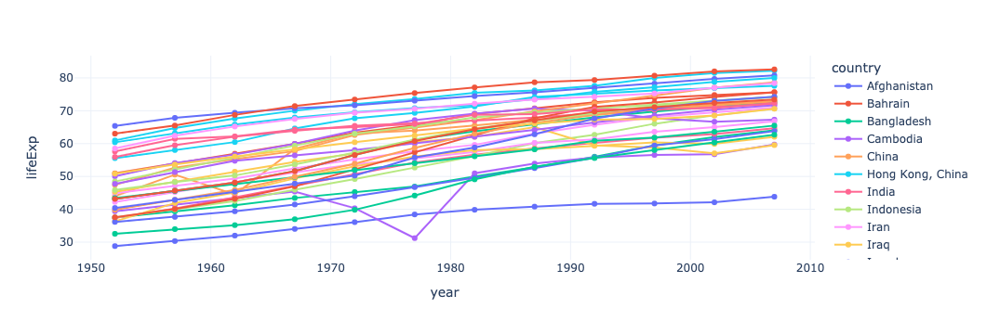

In [274]:
fig = px.line(gapminder_asia, x='year', y='lifeExp', color='country')
fig.update_traces(mode='markers+lines')
fig.update_xaxes(showspikes=True,spikecolor='green', spikesnap='cursor', spikemode='across')
fig.update_yaxes(showspikes=True, spikecolor='orange', spikethickness=2)# 안내선 
fig.update_layout(spikedistance=1000, hoverdistance=100)
fig.show()

### 모양(Shape)

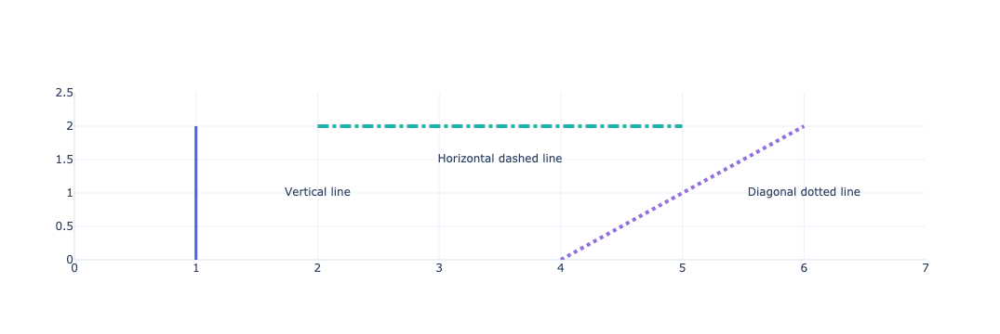

In [280]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=[2, 3.5, 6], y=[1, 1.5, 1],
                         text=['Vertical line', 'Horizontal dashed line',
                               'Diagonal dotted line'],
                         mode='text'))
fig.update_xaxes(range=[0, 7])
fig.update_yaxes(range=[0, 2.5])
fig.add_shape(type='line', x0=1, y0=0, x1=1, y1=2,
                   line=dict(color='royalblue', width=3))
fig.add_shape(type='line', x0=2, y0=2, x1=5, y1=2,
                   line=dict(color='lightseagreen', width=4, dash='dashdot'))
fig.add_shape(type='line', x0=4, y0=0, x1=6, y1=2,
                   line=dict(color='mediumpurple', width=4, dash='dot'))

fig.update_shapes(dict(xref='x', yref='y'))

fig.show()

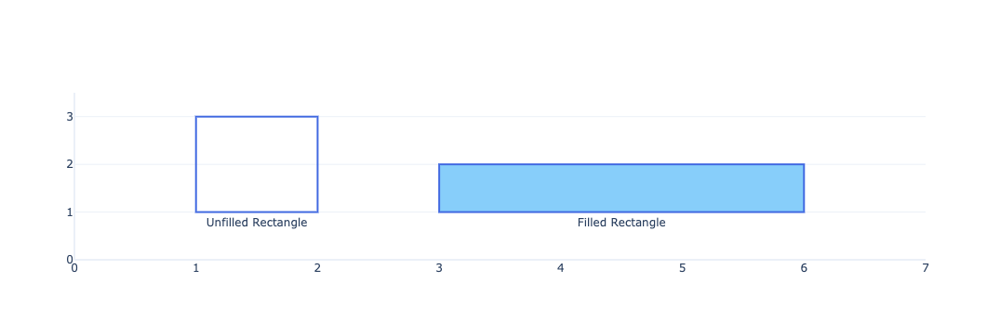

In [281]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=[1.5, 4.5], y=[0.75, 0.75],
                         text=['Unfilled Rectangle', 'Filled Rectangle'],
                         mode='text'))
fig.update_xaxes(range=[0, 7], showgrid=False)
fig.update_yaxes(range=[0, 3.5])
fig.add_shape(type='rect', x0=1, y0=1, x1=2, y1=3,
              line=dict(color='royalblue'))
fig.add_shape(type='rect', x0=3, y0=1, x1=6, y1=2,
              line=dict(color='royalblue', width=2),
             fillcolor='lightskyblue')
fig.update_shapes(dict(xref='x', yref='y'))
fig.show()

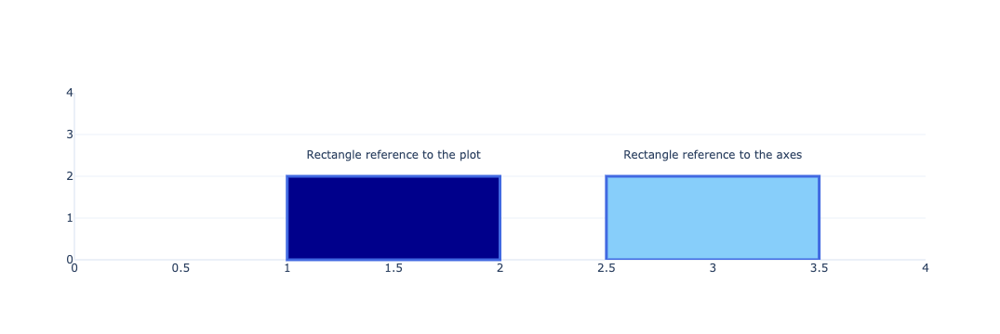

In [283]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=[1.5, 3], y=[2.5, 2.5],
                         text=['Rectangle reference to the plot', 'Rectangle reference to the axes'],
                         mode='text'))
fig.update_xaxes(range=[0, 4], showgrid=False)
fig.update_yaxes(range=[0, 4])
fig.add_shape(type='rect', xref='x', yref='y',
              x0=2.5, y0=0, x1=3.5, y1=2,
              line=dict(color='royalblue',width=3),
             fillcolor='lightskyblue')
fig.add_shape(type='rect', xref='paper', yref='paper', #기준을 paper 4의 0.25는 1
              x0=0.25, y0=0, x1=0.5, y1=0.5,
              line=dict(color='royalblue', width=3),
             fillcolor='darkblue')

fig.show()

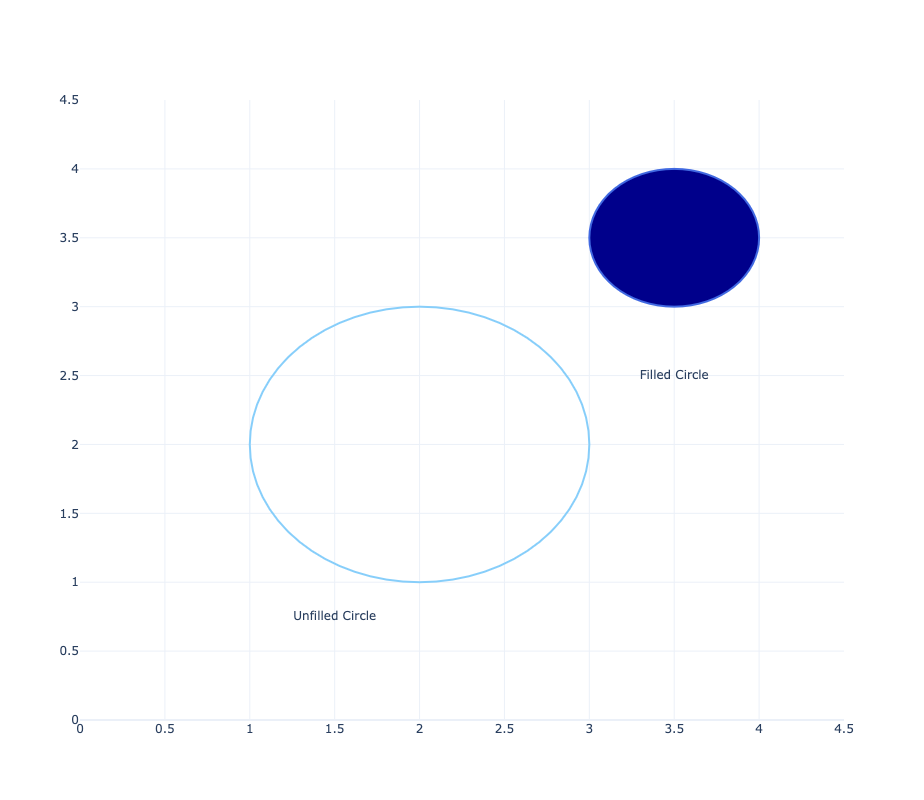

In [290]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=[1.5, 3.5], y=[0.75, 2.5],
                         text=['Unfilled Circle', 'Filled Circle'],
                         mode='text'))
fig.update_xaxes(range=[0, 4.5], zeroline=False)
fig.update_yaxes(range=[0, 4.5])
fig.add_shape(type='circle', xref='x', yref='y',
              x0=1, y0=1, x1=3, y1=3,
              line_color='lightskyblue')
fig.add_shape(type='circle', xref='x', yref='y', #기준을 paper 4의 0.25는 1
              x0=3, y0=3, x1=4, y1=4,
              line=dict(color='royalblue'),
             fillcolor='darkblue')
fig.update_layout(width=800, height=800)

fig.show()

### 색상 척도(Color Scales)

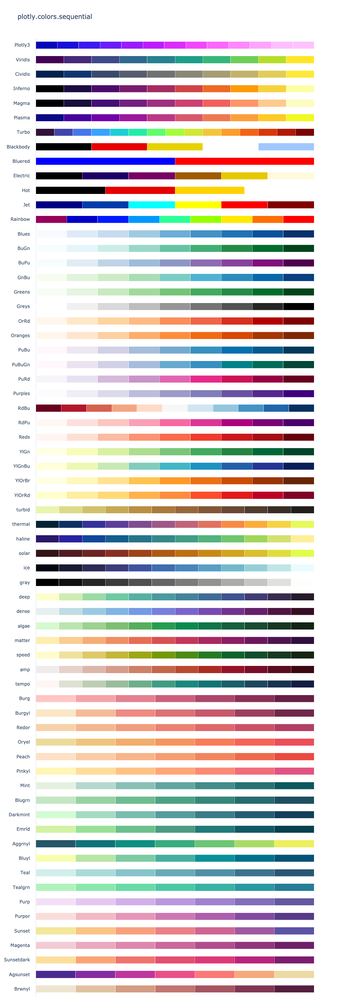

In [292]:
fig = px.colors.sequential.swatches()
fig.show()

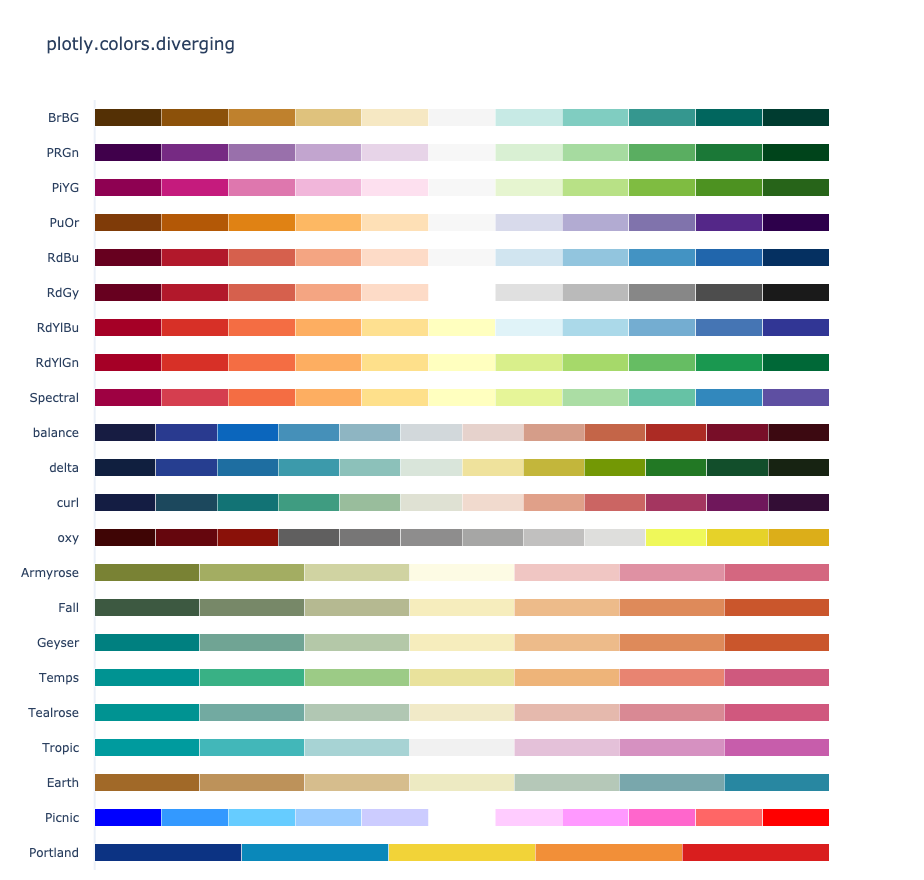

In [294]:
fig = px.colors.diverging.swatches().update_layout(margin_b=10)
fig.show()

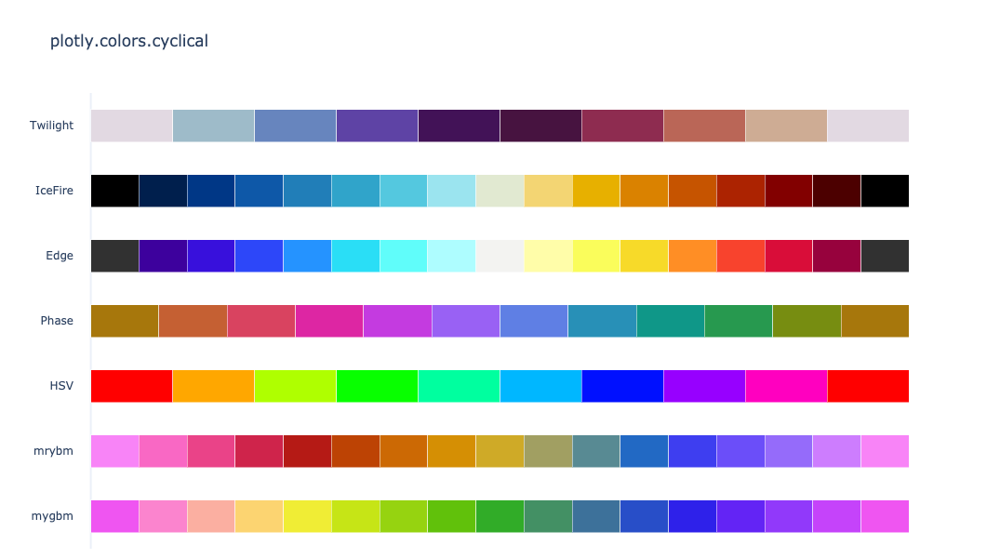

In [296]:
fig = px.colors.cyclical.swatches()
fig.show()

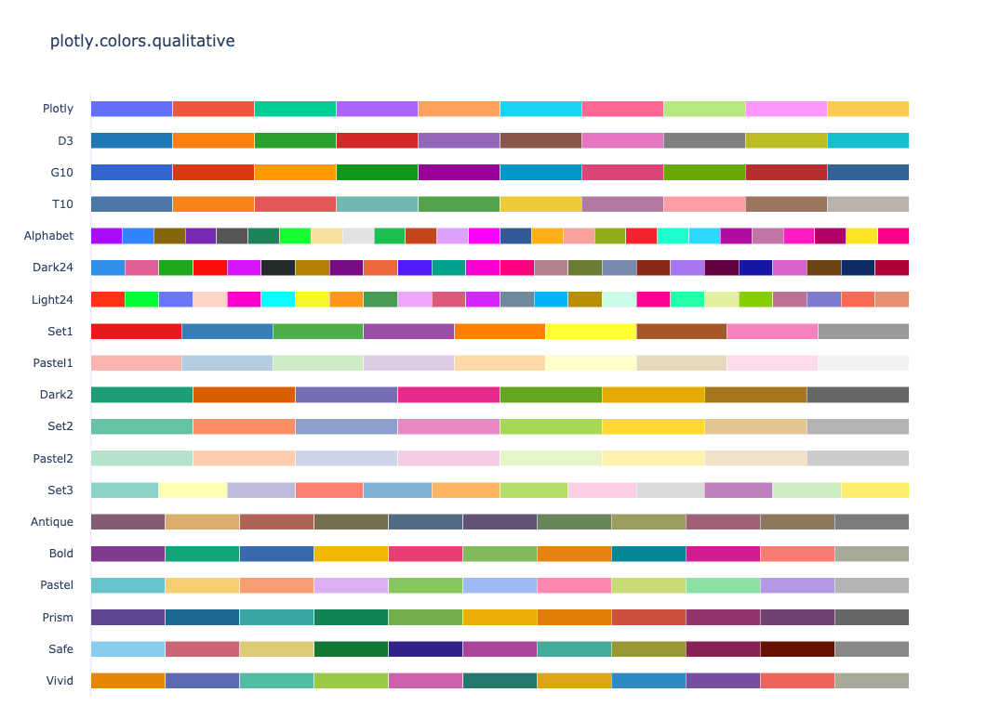

In [297]:
fig = px.colors.qualitative.swatches()
fig.show()